## 필요라이브러 로드

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from datetime import datetime

In [2]:
import platform
from matplotlib import font_manager, rc

# 한글 폰트 지정
path = "C:/Windows/Fonts/malgun.ttf"
if platform.system() == "Windows":
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
elif platform.system()=="Darwin":
    rc('font', family='AppleGothic')
else:
    print("Unknown System")

In [3]:
import os

In [4]:
os.listdir()

['crawled_data',
 'day_genie.ipynb',
 'live_flo.ipynb',
 'live_genie.ipynb',
 'live_melon.ipynb',
 'live_soribada.ipynb',
 'live_vibe.ipynb',
 'melon_crawling_test.ipynb',
 'melon_file_check.ipynb',
 'month_genie.ipynb',
 'month_melon.ipynb',
 'README.md',
 'test_graph_genie2022_1_3.ipynb',
 'test_mysql.ipynb',
 'week_genie.ipynb',
 'week_melon.ipynb']

In [7]:
path = 'crawled_data/day_genie'
os.chdir(path)
file_list = os.listdir()
file_list

['day_genie_20220101.xlsx',
 'day_genie_20220102.xlsx',
 'day_genie_20220103.xlsx',
 'day_genie_20220104.xlsx',
 'day_genie_20220105.xlsx',
 'day_genie_20220106.xlsx',
 'day_genie_20220107.xlsx',
 'day_genie_20220108.xlsx',
 'day_genie_20220109.xlsx',
 'day_genie_20220110.xlsx',
 'day_genie_20220111.xlsx',
 'day_genie_20220112.xlsx',
 'day_genie_20220113.xlsx',
 'day_genie_20220114.xlsx',
 'day_genie_20220115.xlsx',
 'day_genie_20220116.xlsx',
 'day_genie_20220117.xlsx',
 'day_genie_20220118.xlsx',
 'day_genie_20220119.xlsx',
 'day_genie_20220120.xlsx',
 'day_genie_20220121.xlsx',
 'day_genie_20220122.xlsx',
 'day_genie_20220123.xlsx',
 'day_genie_20220124.xlsx',
 'day_genie_20220125.xlsx',
 'day_genie_20220126.xlsx',
 'day_genie_20220127.xlsx',
 'day_genie_20220128.xlsx',
 'day_genie_20220129.xlsx',
 'day_genie_20220130.xlsx',
 'day_genie_20220131.xlsx',
 'day_genie_20220201.xlsx',
 'day_genie_20220202.xlsx',
 'day_genie_20220203.xlsx',
 'day_genie_20220204.xlsx',
 'day_genie_20220205

In [8]:
file_list[0]

'day_genie_20220101.xlsx'

In [9]:
len(file_list)

90

# 수집한 파일 모두 합치기

In [10]:
df = pd.DataFrame()
for one in file_list:
    temp = pd.read_excel(one)
    df = pd.concat([df, temp], ignore_index=True)

In [11]:
df

,날짜,순위,곡,가수,앨범
0,2022-01-01,1,겨울잠,아이유 (IU),조각집
1,2022-01-01,2,회전목마 (Feat. Zion.T & 원슈타인) (Prod. by Slom),sokodomo,쇼미더머니 10 Episode 2
2,2022-01-01,3,Counting Stars (Feat. Beenzino),BE'O (비오),Counting Stars
3,2022-01-01,4,리무진 (Feat. MINO) (Prod. by GRAY),BE'O (비오),쇼미더머니 10 Episode 3
4,2022-01-01,5,드라마,아이유 (IU),조각집
...,...,...,...,...,...
8995,2022-03-31,96,Dun Dun Dance,오마이걸 (OH MY GIRL),Dear OHMYGIRL
8996,2022-03-31,97,그날에 나는 맘이 편했을까,이예준,그날에 나는 맘이 편했을까
8997,2022-03-31,98,Wake Up (Prod. by 코드 쿤스트),개코 & 아우릴고트 (OUREALGOAT) & SINCE & 안병웅 & Tabber...,쇼미더머니 10 Episode 1
8998,2022-03-31,99,비가 오는 날엔 (2021),헤이즈 (Heize),비가 오는 날엔 (2021)


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      9000 non-null   object
 1   순위      9000 non-null   int64 
 2   곡       9000 non-null   object
 3   가수      9000 non-null   object
 4   앨범      9000 non-null   object
dtypes: int64(1), object(4)
memory usage: 351.7+ KB


## 노래 선택

In [13]:
song = df['곡'][9]
song

'정거장'

In [14]:
sort_df = df[df['곡'] == song].reset_index(drop=True)
sort_df

,날짜,순위,곡,가수,앨범
0,2022-01-01,10,정거장,아이유 (IU),조각집
1,2022-01-02,10,정거장,아이유 (IU),조각집
2,2022-01-03,12,정거장,아이유 (IU),조각집
3,2022-01-04,13,정거장,아이유 (IU),조각집
4,2022-01-05,16,정거장,아이유 (IU),조각집
5,2022-01-06,17,정거장,아이유 (IU),조각집
6,2022-01-07,21,정거장,아이유 (IU),조각집
7,2022-01-08,23,정거장,아이유 (IU),조각집
8,2022-01-09,23,정거장,아이유 (IU),조각집
9,2022-01-10,24,정거장,아이유 (IU),조각집


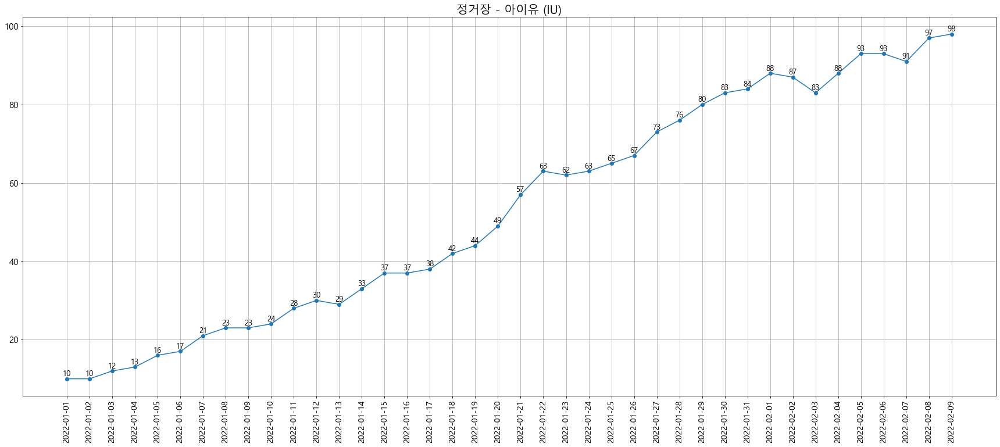

In [15]:
x = sort_df['날짜']
y = sort_df['순위']
title = sort_df['곡'][0]
artist = sort_df['가수'][0]

plt.figure(figsize=(30, 12))
plt.grid()
plt.plot(x, y, '-o')
plt.title(title + ' - ' + artist, fontdict={'size':20})
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=15)
for i in range(len(x)):
    h = y[i]
    plt.text(x[i], h+0.25, '%.1i' %h, ha='center', va='bottom', size=13)
plt.show()

In [16]:
# 날짜 데이터 셋 생성
dates = pd.date_range('2022-01-01', '2022-03-31')

In [17]:
basic_date_df = pd.DataFrame({'날짜':dates})
basic_date_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   날짜      90 non-null     datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 848.0 bytes


In [18]:
basic_date_df['날짜'] = basic_date_df['날짜'].astype('str')
basic_date_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      90 non-null     object
dtypes: object(1)
memory usage: 848.0+ bytes


In [19]:
sort_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      40 non-null     object
 1   순위      40 non-null     int64 
 2   곡       40 non-null     object
 3   가수      40 non-null     object
 4   앨범      40 non-null     object
dtypes: int64(1), object(4)
memory usage: 1.7+ KB


In [20]:
merge_df = pd.merge(basic_date_df, sort_df, how='left', on='날짜')
merge_df

,날짜,순위,곡,가수,앨범
0,2022-01-01,10.0,정거장,아이유 (IU),조각집
1,2022-01-02,10.0,정거장,아이유 (IU),조각집
2,2022-01-03,12.0,정거장,아이유 (IU),조각집
3,2022-01-04,13.0,정거장,아이유 (IU),조각집
4,2022-01-05,16.0,정거장,아이유 (IU),조각집
...,...,...,...,...,...
85,2022-03-27,NaN,NaN,NaN,NaN
86,2022-03-28,NaN,NaN,NaN,NaN
87,2022-03-29,NaN,NaN,NaN,NaN
88,2022-03-30,NaN,NaN,NaN,NaN


In [21]:
merge_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 0 to 89
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   날짜      90 non-null     object 
 1   순위      40 non-null     float64
 2   곡       40 non-null     object 
 3   가수      40 non-null     object 
 4   앨범      40 non-null     object 
dtypes: float64(1), object(4)
memory usage: 4.2+ KB


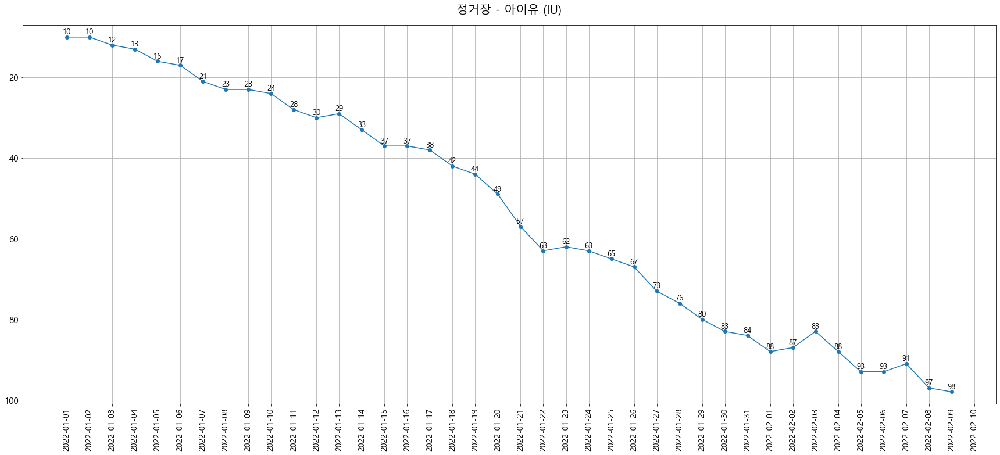

In [22]:
x = merge_df['날짜']
y = merge_df['순위']
title = merge_df['곡'][0]
artist = merge_df['가수'][0]

plt.figure(figsize=(30, 12))
plt.grid()
plt.plot(x, y, '-o')
plt.title(title + ' - ' + artist, fontdict={'size':20}, pad=20)
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=15)
plt.ylim(max(y) + 3, min(y) - 3)

for i in range(len(x)):
    h = y[i]
    try :
        plt.text(x[i], h-0.25, f'{int(h)}', ha='center', va='bottom', size=13)
    except:
        pass
plt.show()

# 2022-01-01 Top100 곡. 그래프 시각화

## 날짜 df과 곡 순위 df 합치는 함수

In [23]:
def merge_set(sort_df):
    dates = pd.date_range('2022-01-01', '2022-03-31')
    basic_date_df = pd.DataFrame({'날짜':dates})
    basic_date_df['날짜'] = basic_date_df['날짜'].astype('str')
    merge_df = pd.merge(basic_date_df, sort_df, how='left', on='날짜')

    return merge_df

## 그래프 시각화 함수

In [24]:
def graph(df):
    x = df['날짜']
    y = df['순위']
    title = df['곡'][0]
    artist = df['가수'][0]

    plt.figure(figsize=(30, 12))
    plt.grid()
    plt.plot(x, y, '-o')
    plt.title(title + ' - ' + artist, fontdict={'size':20}, pad=20)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=15)
    plt.ylim(max(y) + 3, min(y) - 3)
    plt.margins()
    for i in range(len(x)):
        h = y[i]
        try :
            plt.text(x[i], h-0.25, f'{int(h)}', ha='center', va='bottom', size=13)
        except:
            pass
    plt.show()

## 3곡만 테스트

  0%|          | 0/3 [00:00<?, ?it/s]

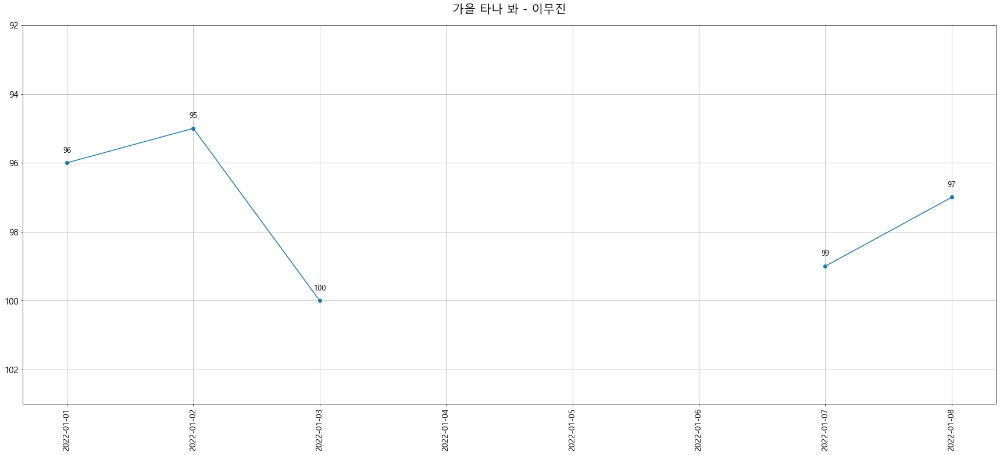

 33%|███▎      | 1/3 [00:00<00:00,  3.08it/s]

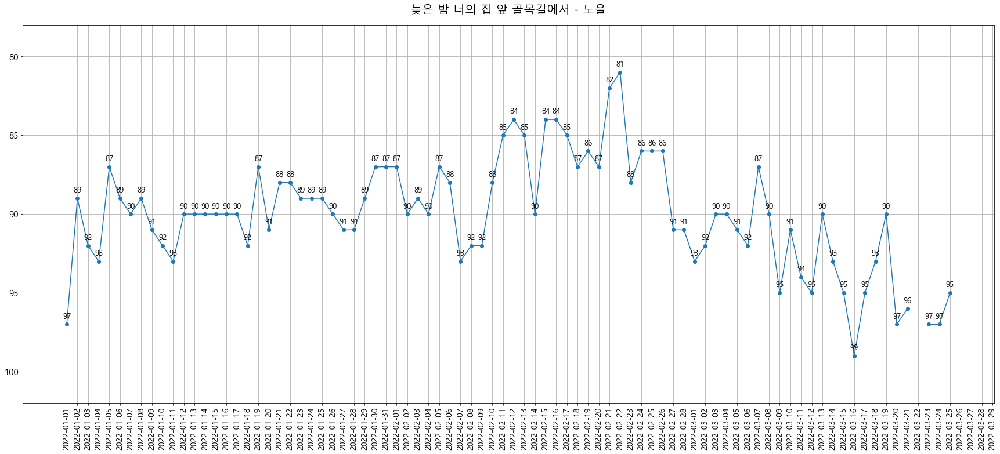

 67%|██████▋   | 2/3 [00:01<00:01,  1.09s/it]

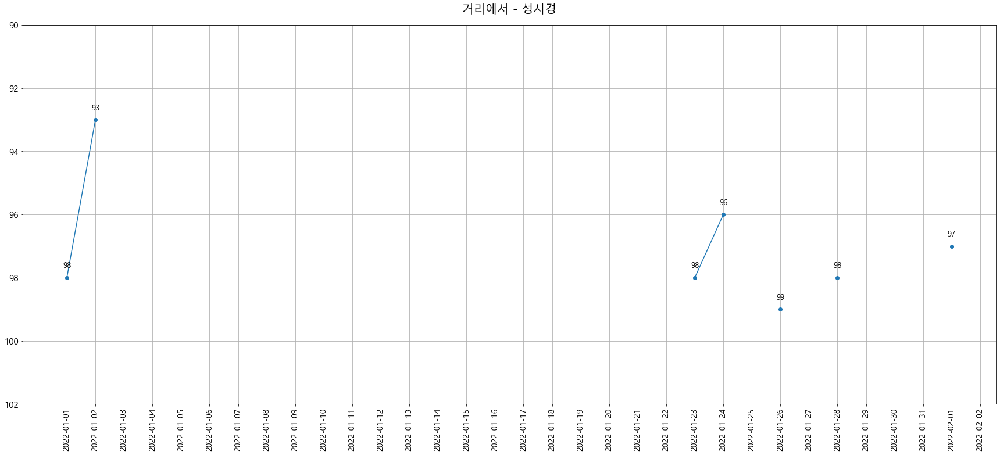

100%|██████████| 3/3 [00:02<00:00,  1.24it/s]


In [25]:
for one in tqdm(df['곡'][95:98]):
    sort_df = df[df['곡'] == one].reset_index(drop=True)
    sort_set = merge_set(sort_df)
    graph(sort_set)

# 100곡 전부 테스트

  0%|          | 0/100 [00:00<?, ?it/s]

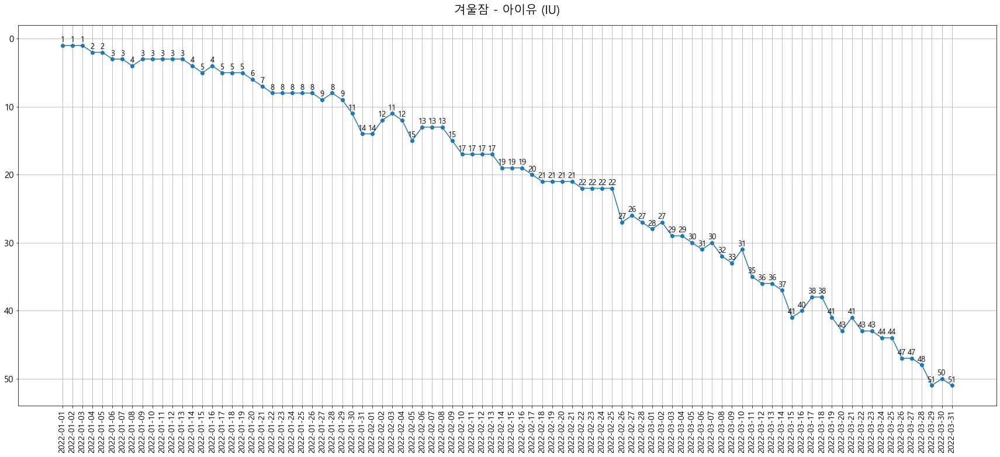

  1%|          | 1/100 [00:01<02:27,  1.49s/it]

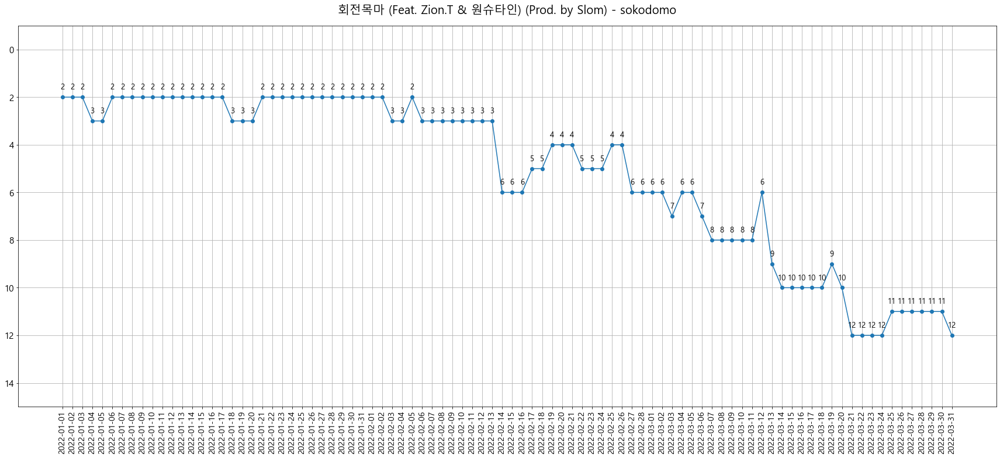

  2%|▏         | 2/100 [00:02<02:06,  1.29s/it]

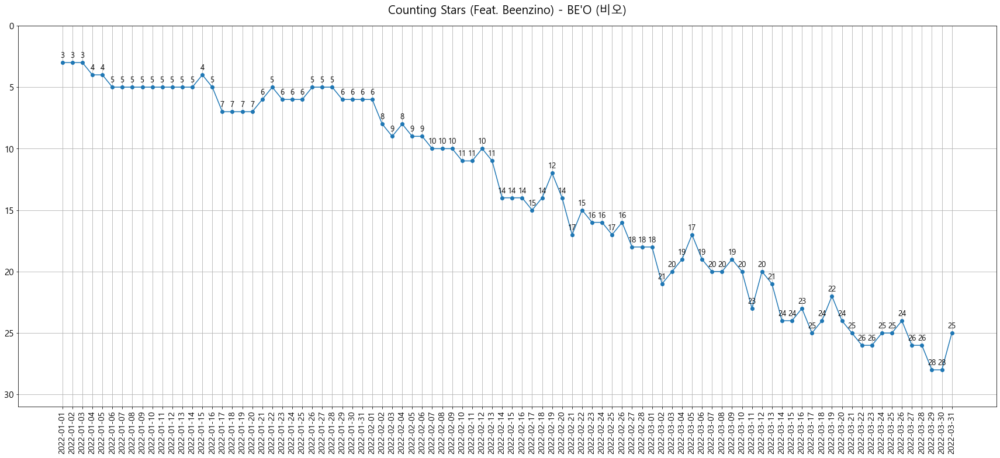

  3%|▎         | 3/100 [00:03<02:02,  1.27s/it]

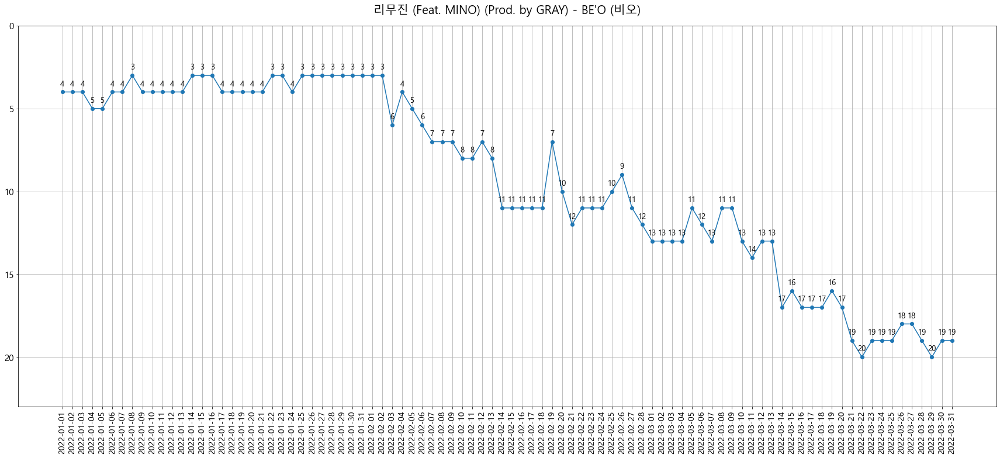

  4%|▍         | 4/100 [00:05<01:59,  1.25s/it]

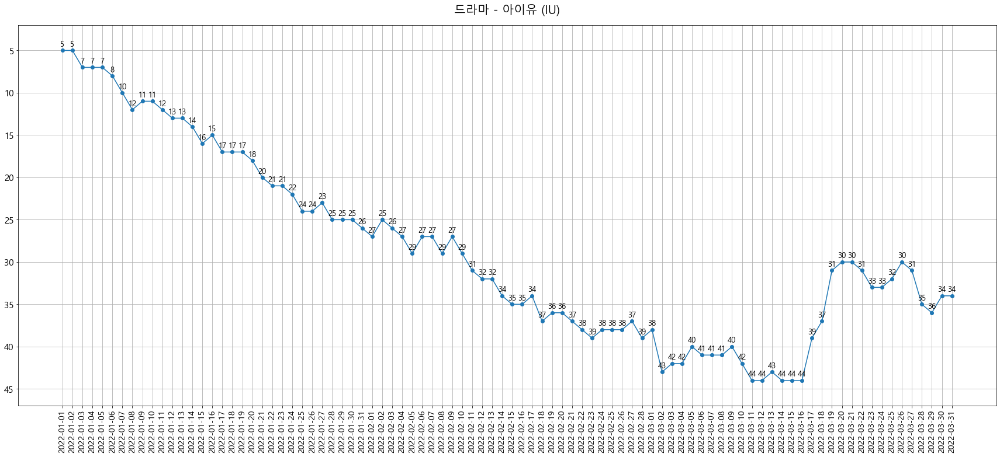

  5%|▌         | 5/100 [00:06<01:57,  1.24s/it]

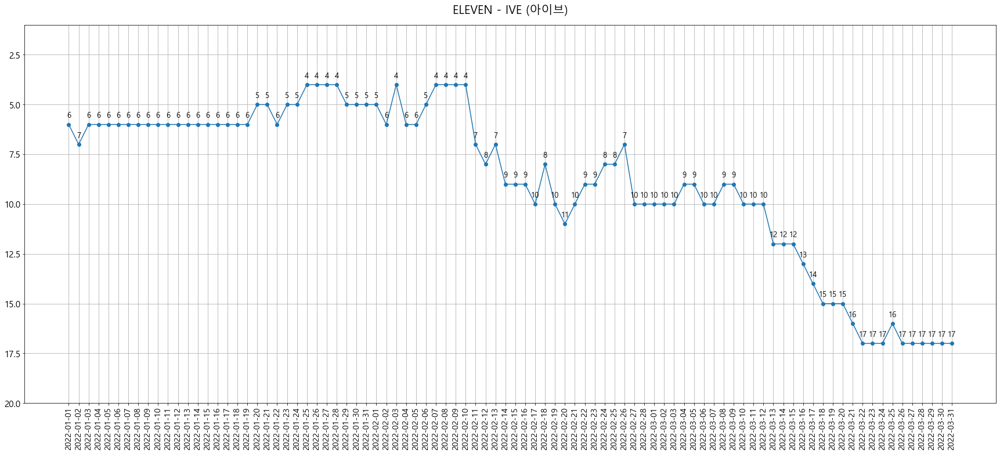

  6%|▌         | 6/100 [00:07<01:54,  1.22s/it]

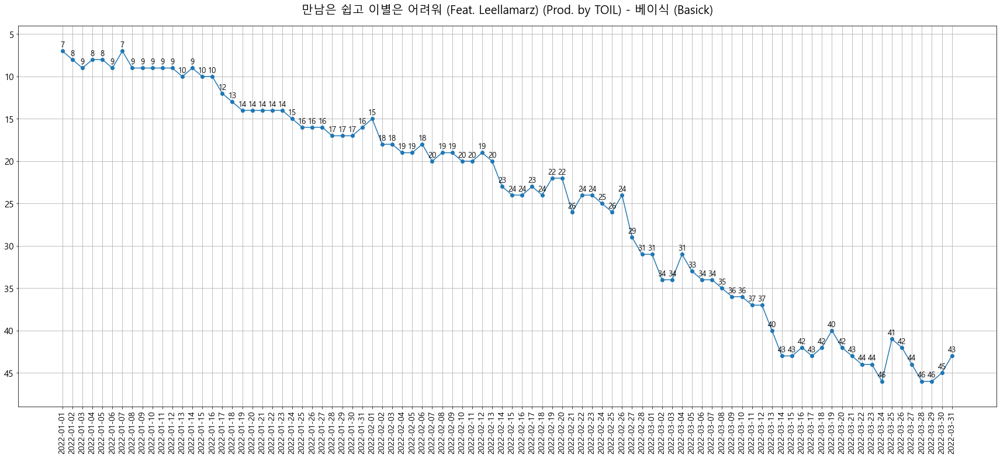

  7%|▋         | 7/100 [00:08<01:53,  1.22s/it]

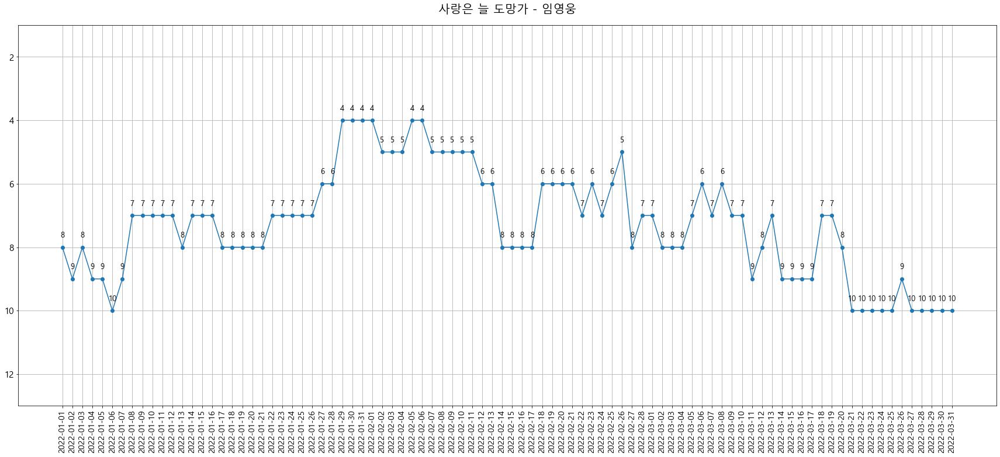

  8%|▊         | 8/100 [00:09<01:50,  1.20s/it]C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


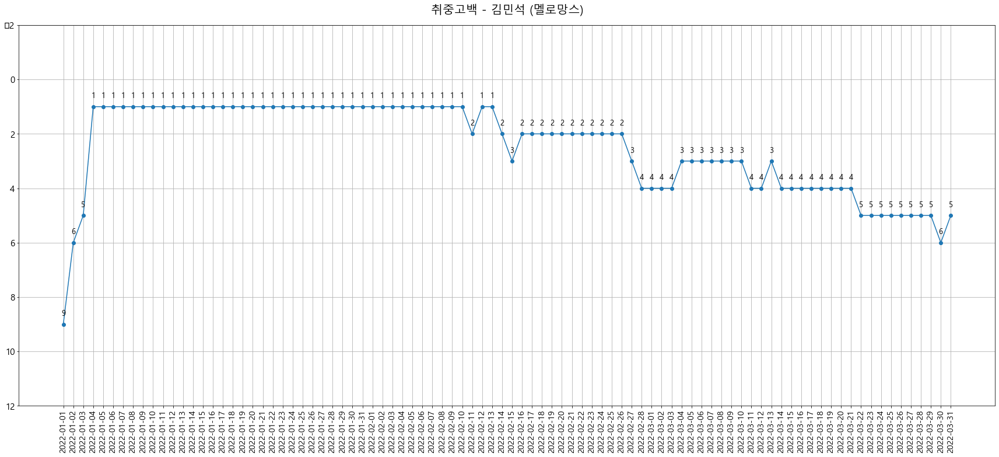

  9%|▉         | 9/100 [00:11<01:52,  1.24s/it]

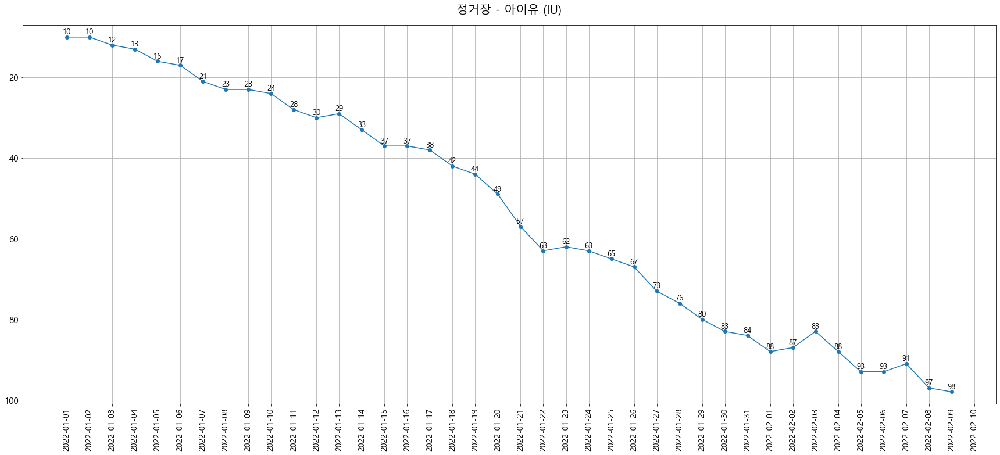

 10%|█         | 10/100 [00:11<01:31,  1.01s/it]

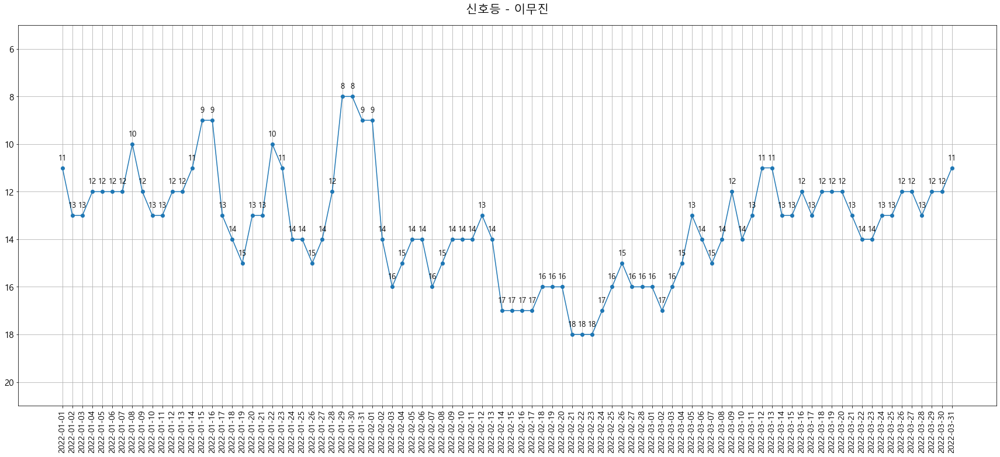

 11%|█         | 11/100 [00:12<01:35,  1.07s/it]

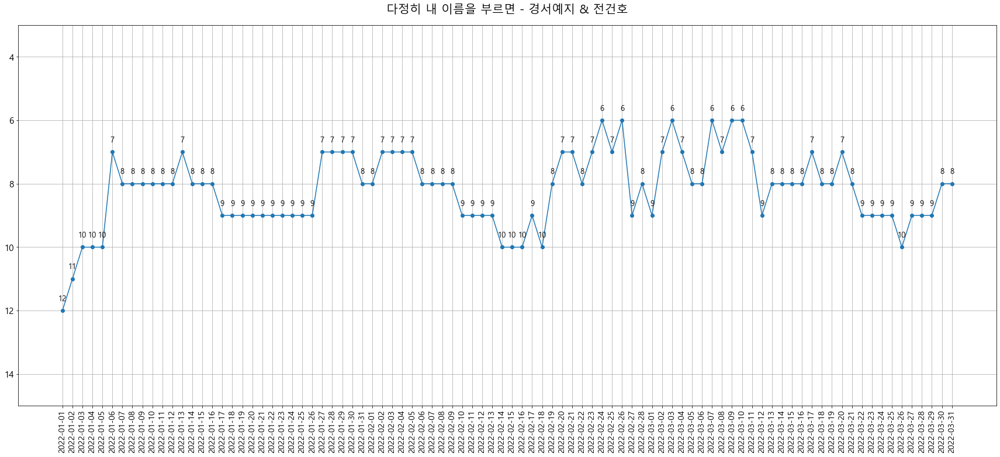

 12%|█▏        | 12/100 [00:14<01:36,  1.10s/it]

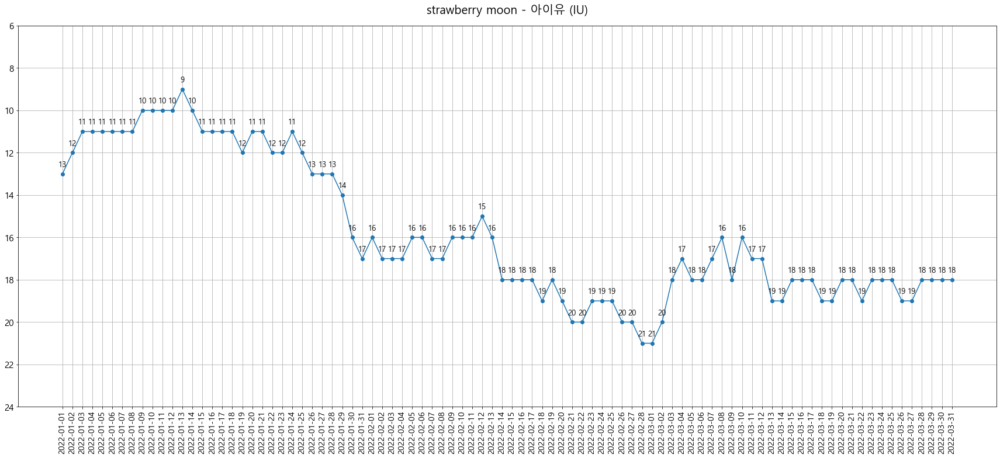

 13%|█▎        | 13/100 [00:15<01:38,  1.14s/it]

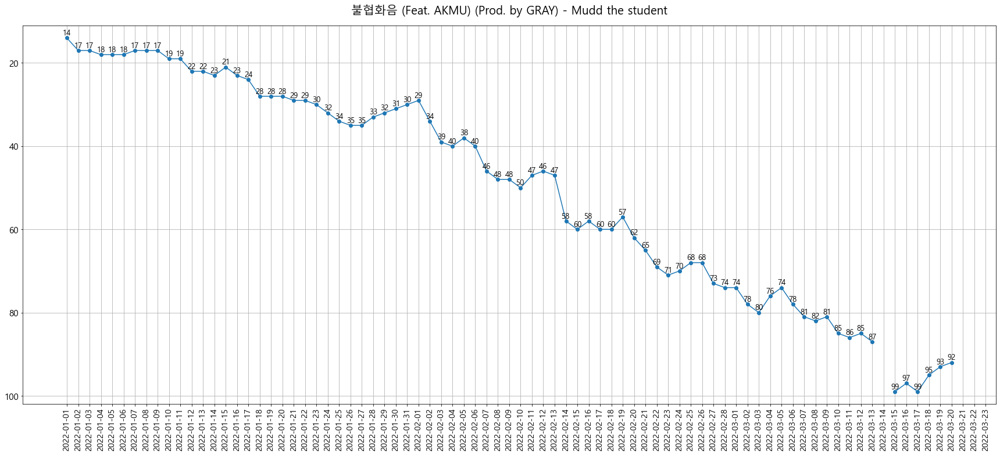

 14%|█▍        | 14/100 [00:16<01:37,  1.13s/it]

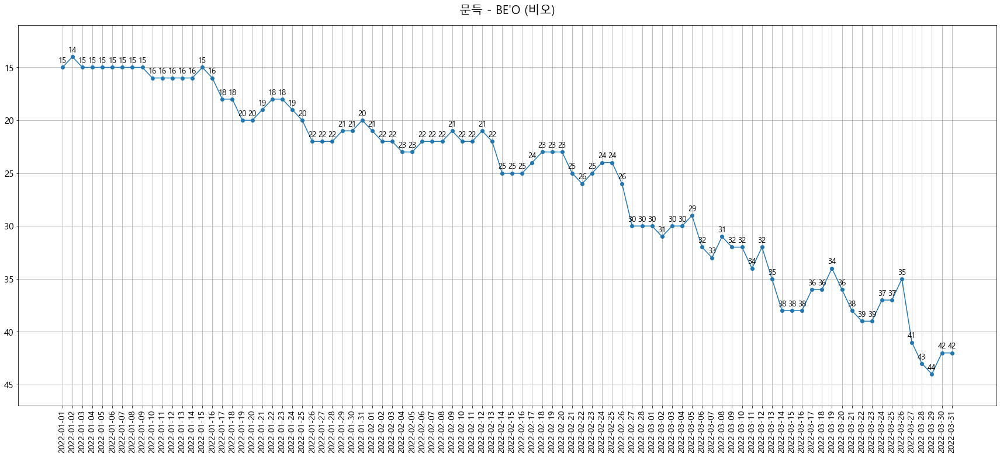

 15%|█▌        | 15/100 [00:17<01:37,  1.15s/it]

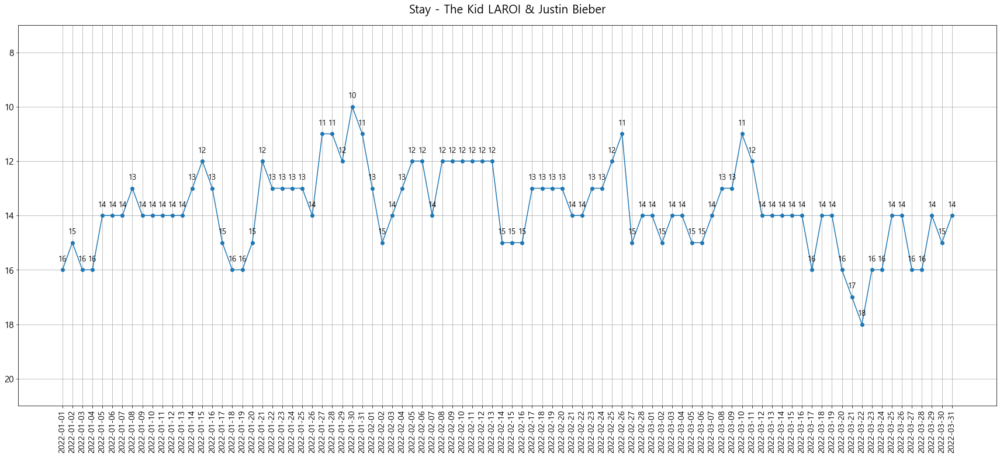

 16%|█▌        | 16/100 [00:18<01:39,  1.18s/it]

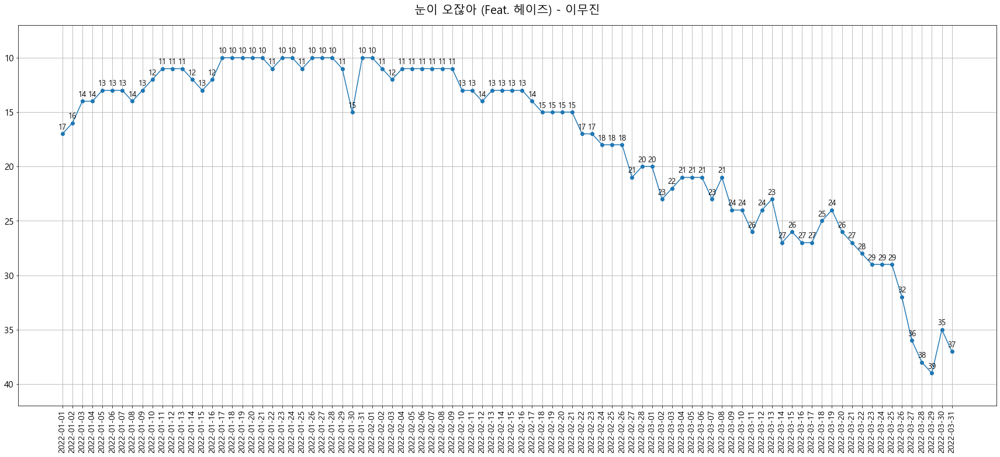

 17%|█▋        | 17/100 [00:20<01:38,  1.19s/it]

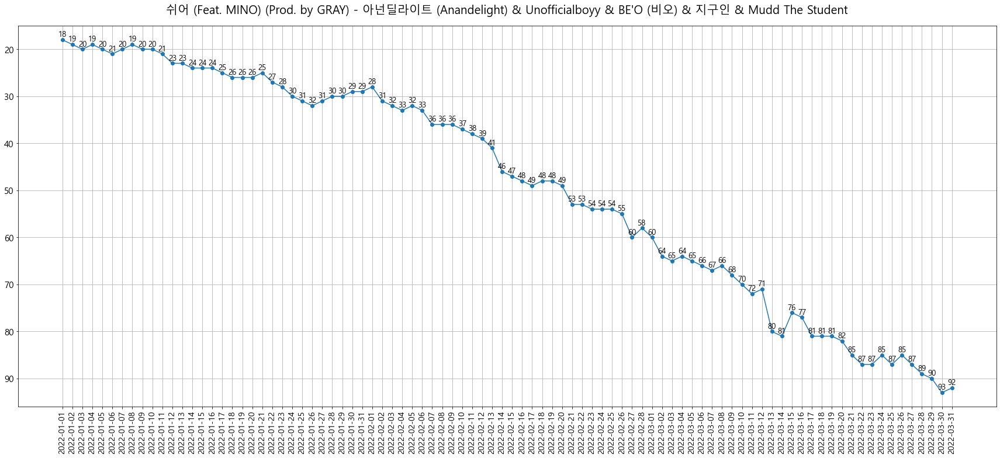

 18%|█▊        | 18/100 [00:21<01:38,  1.20s/it]

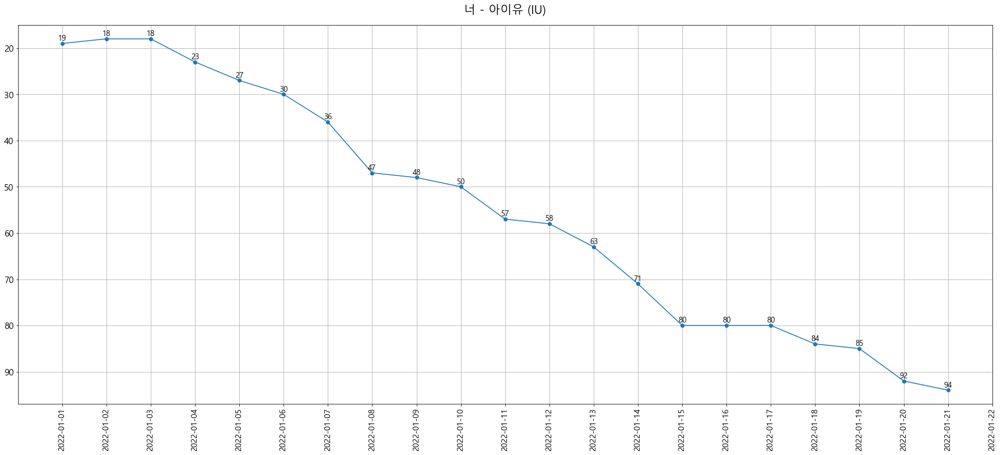

 19%|█▉        | 19/100 [00:21<01:17,  1.05it/s]

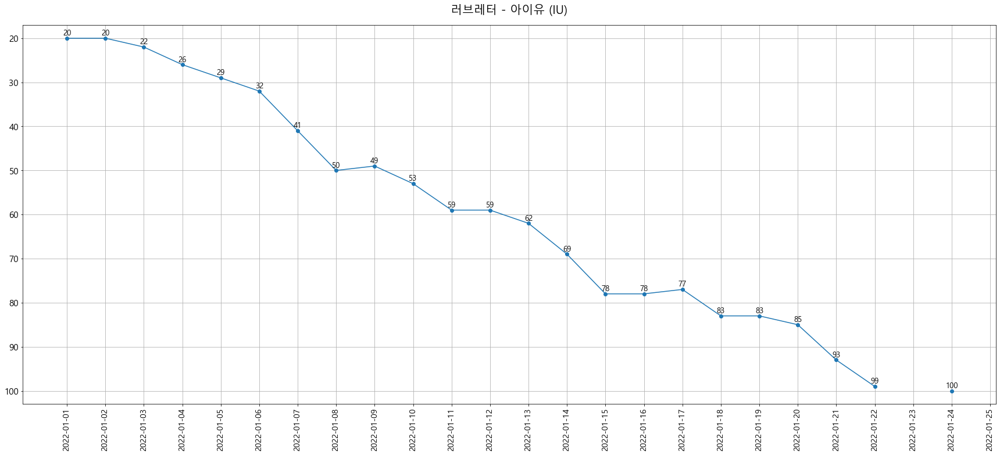

 20%|██        | 20/100 [00:22<01:02,  1.27it/s]

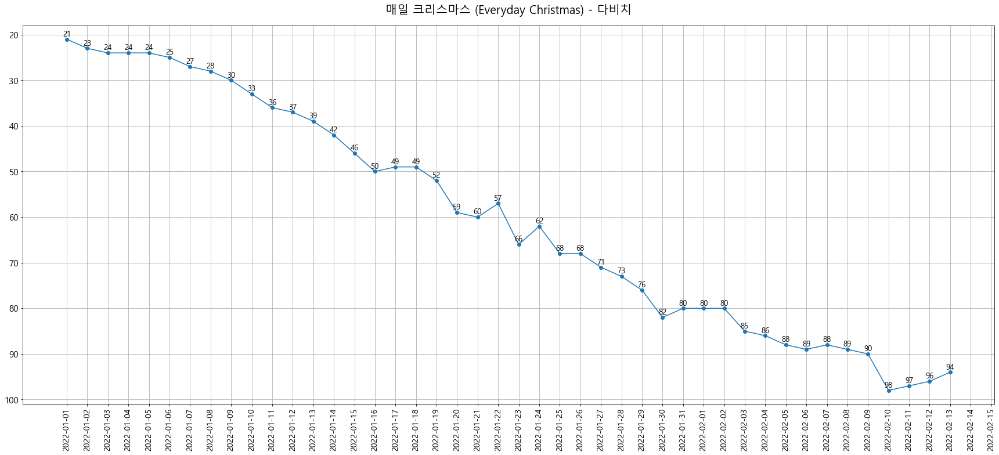

 21%|██        | 21/100 [00:22<00:58,  1.35it/s]

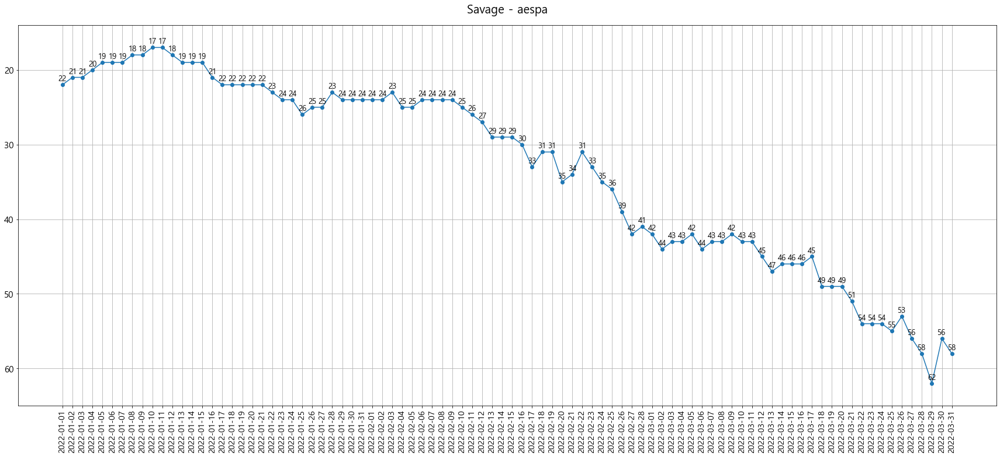

 22%|██▏       | 22/100 [00:23<01:08,  1.14it/s]

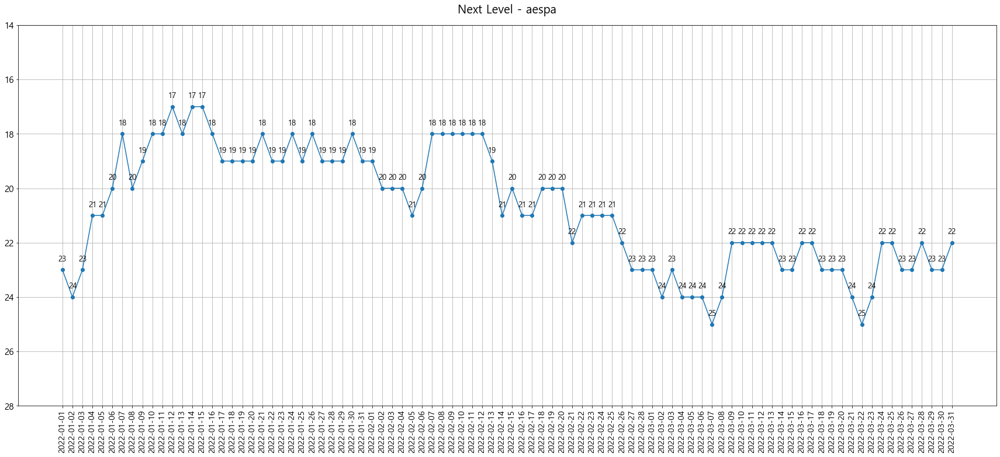

 23%|██▎       | 23/100 [00:25<01:14,  1.03it/s]

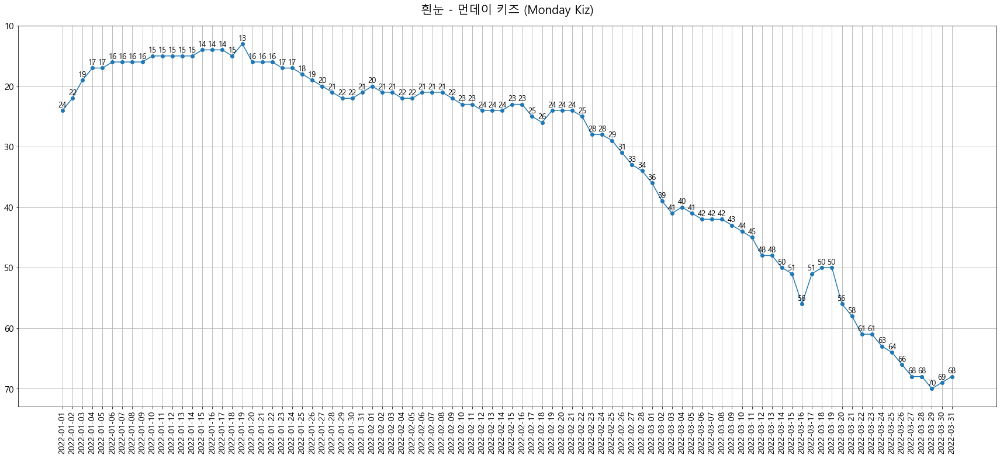

 24%|██▍       | 24/100 [00:26<01:20,  1.06s/it]

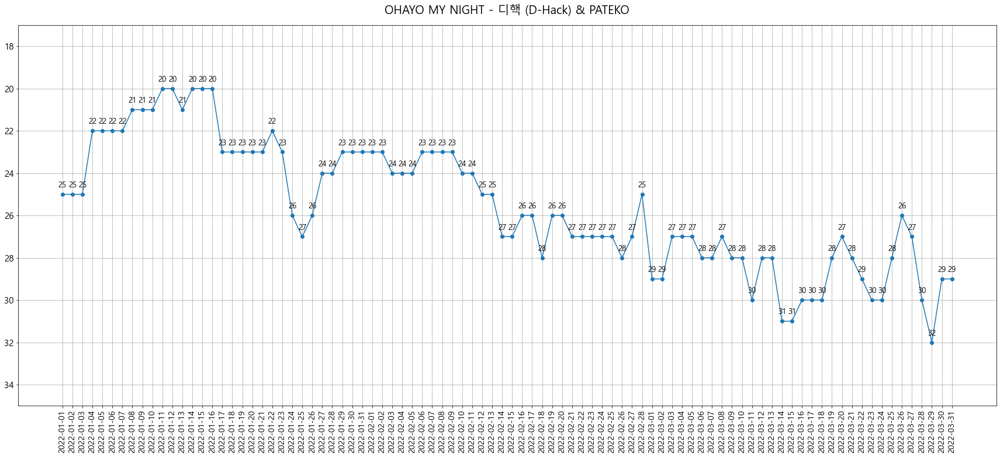

 25%|██▌       | 25/100 [00:27<01:22,  1.10s/it]

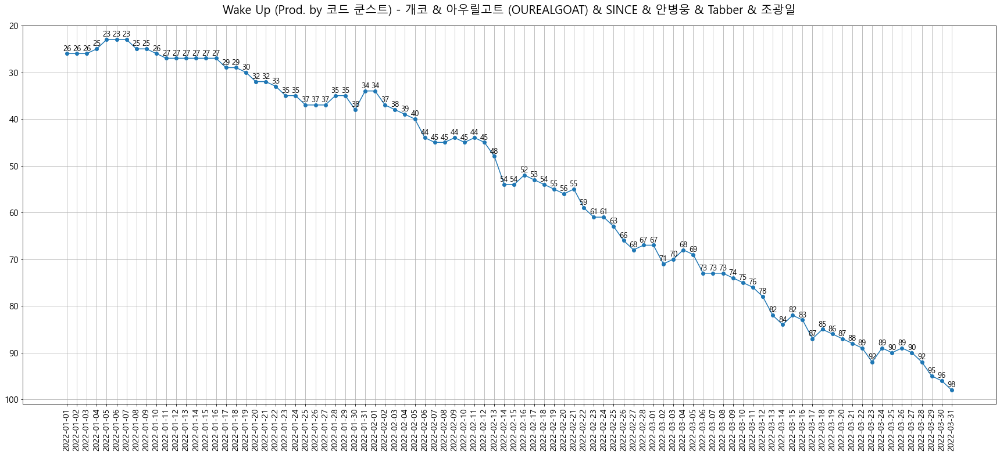

 26%|██▌       | 26/100 [00:28<01:24,  1.15s/it]

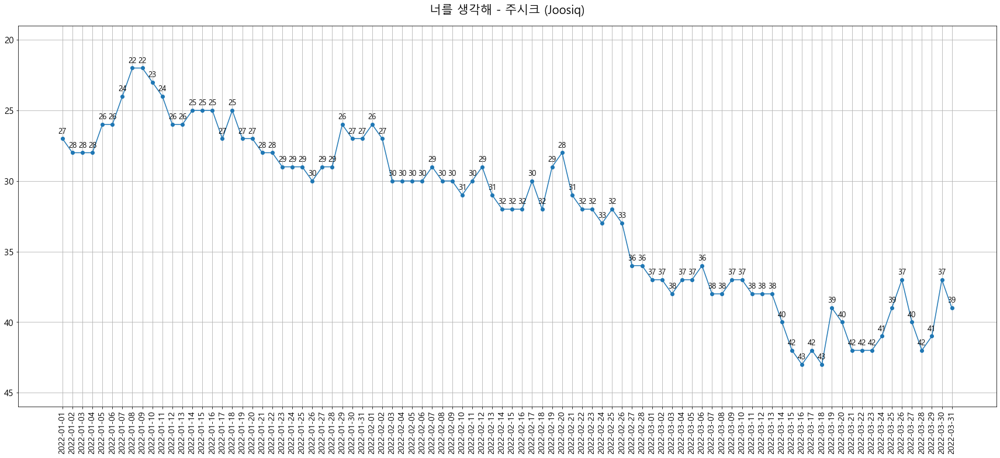

 27%|██▋       | 27/100 [00:30<01:24,  1.16s/it]

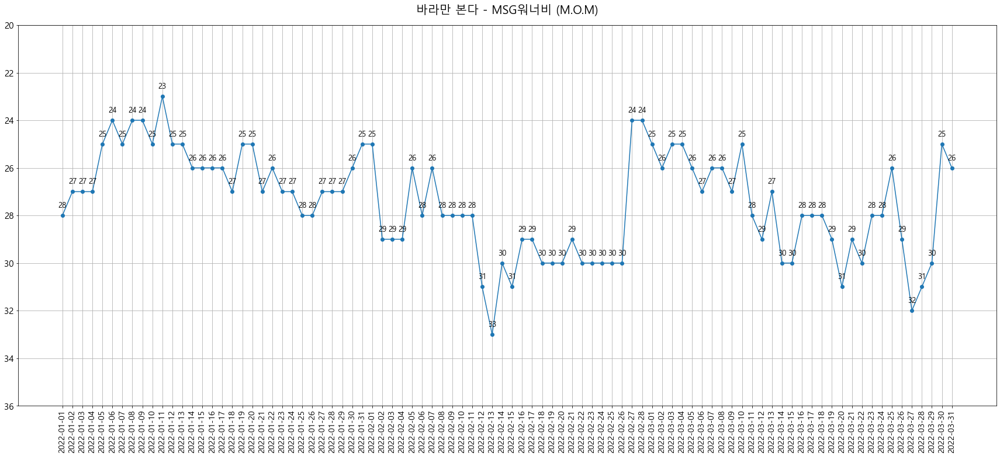

 28%|██▊       | 28/100 [00:31<01:27,  1.22s/it]

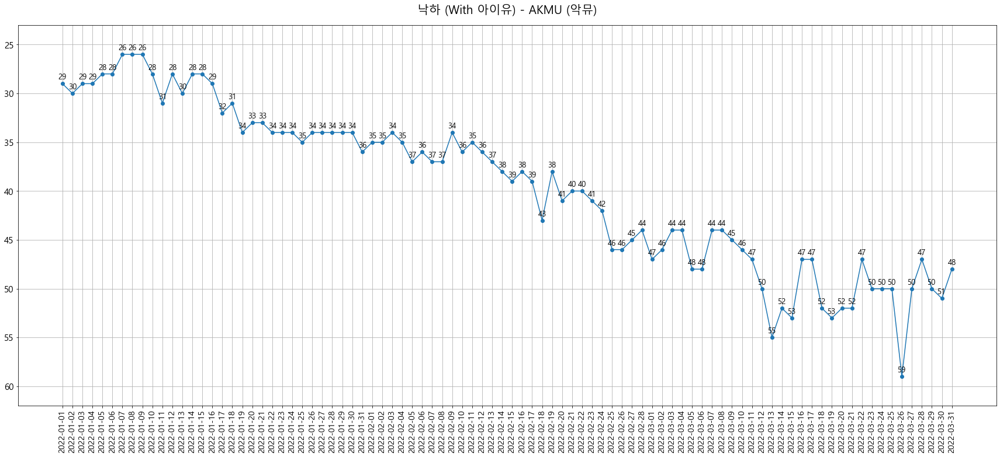

 29%|██▉       | 29/100 [00:32<01:26,  1.22s/it]

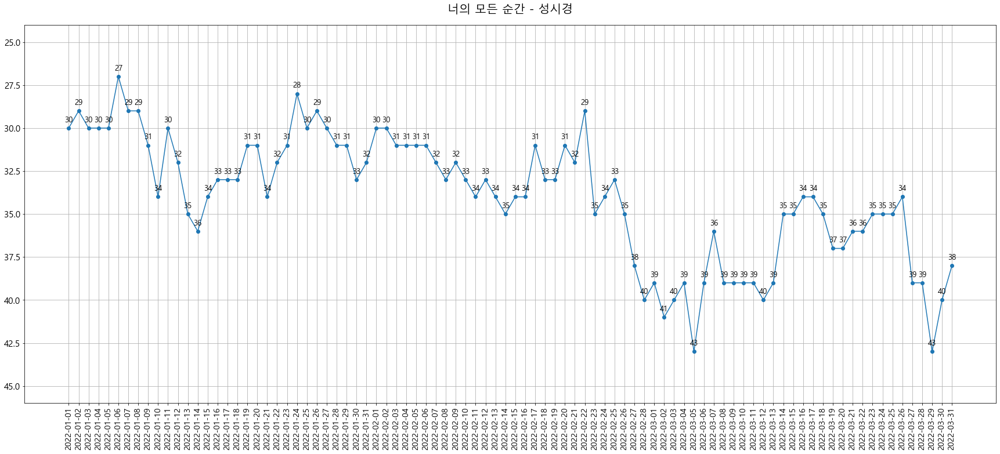

 30%|███       | 30/100 [00:33<01:25,  1.22s/it]

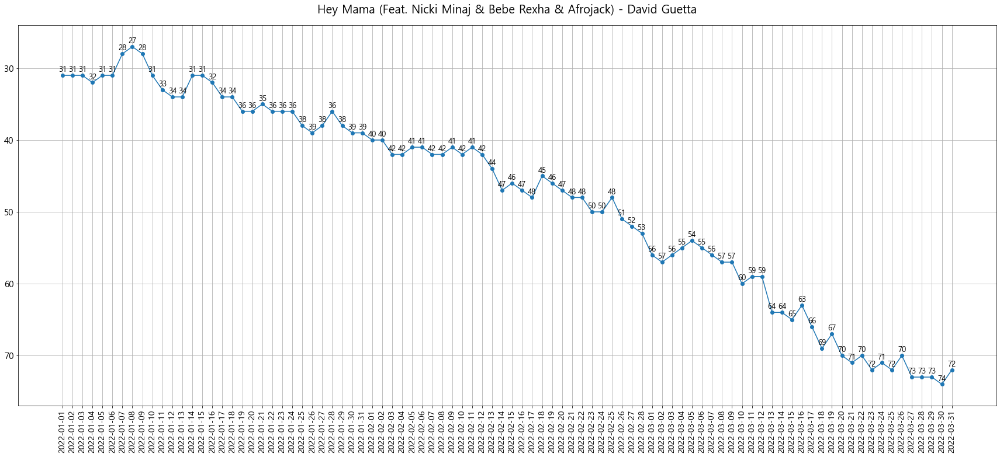

 31%|███       | 31/100 [00:35<01:23,  1.22s/it]

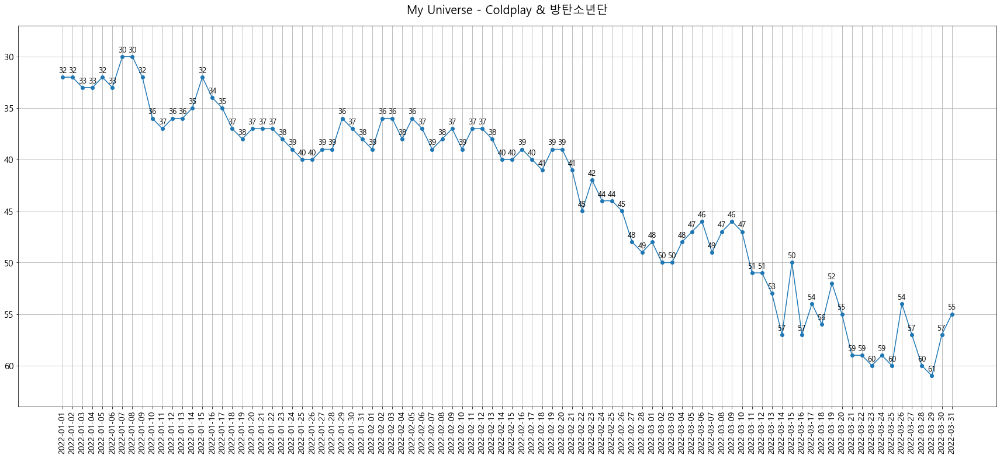

 32%|███▏      | 32/100 [00:36<01:26,  1.28s/it]

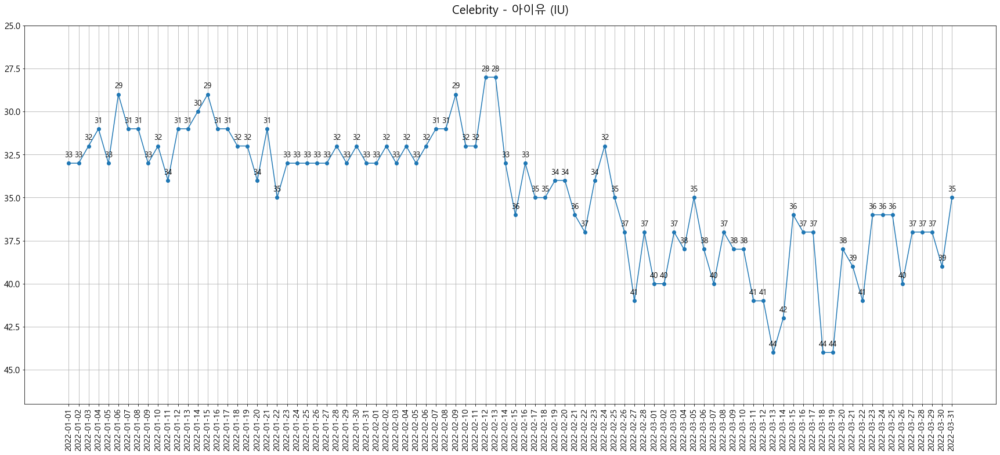

 33%|███▎      | 33/100 [00:37<01:23,  1.24s/it]

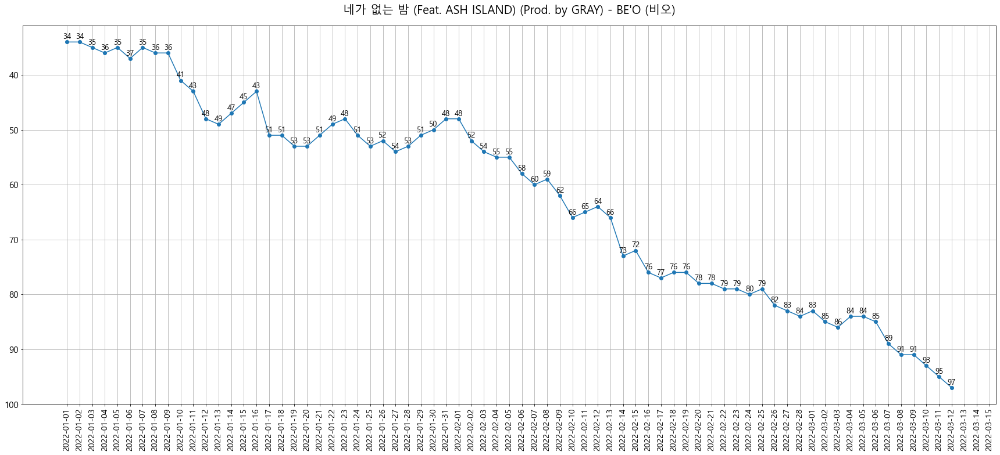

 34%|███▍      | 34/100 [00:38<01:17,  1.17s/it]

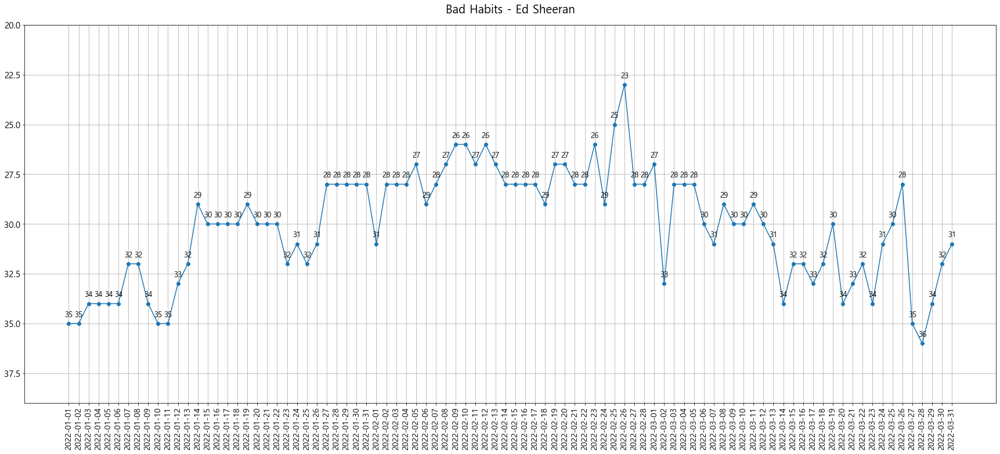

 35%|███▌      | 35/100 [00:39<01:16,  1.18s/it]

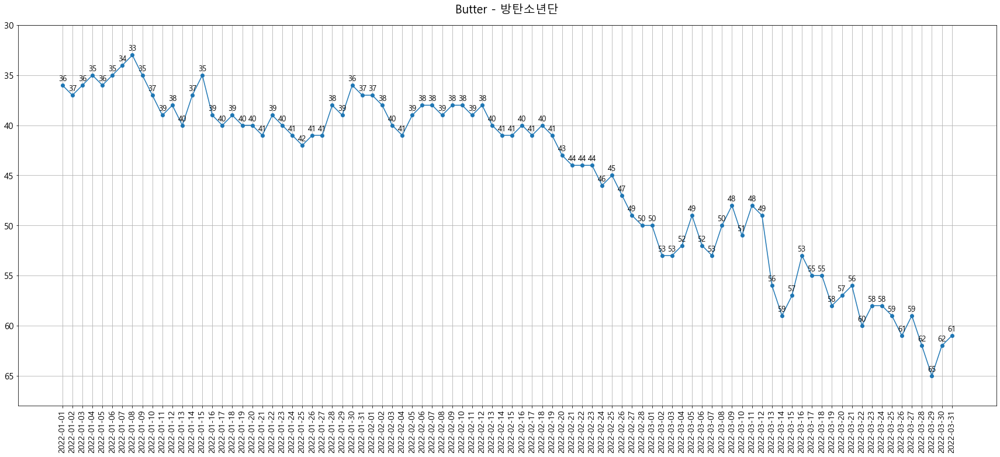

 36%|███▌      | 36/100 [00:40<01:14,  1.17s/it]

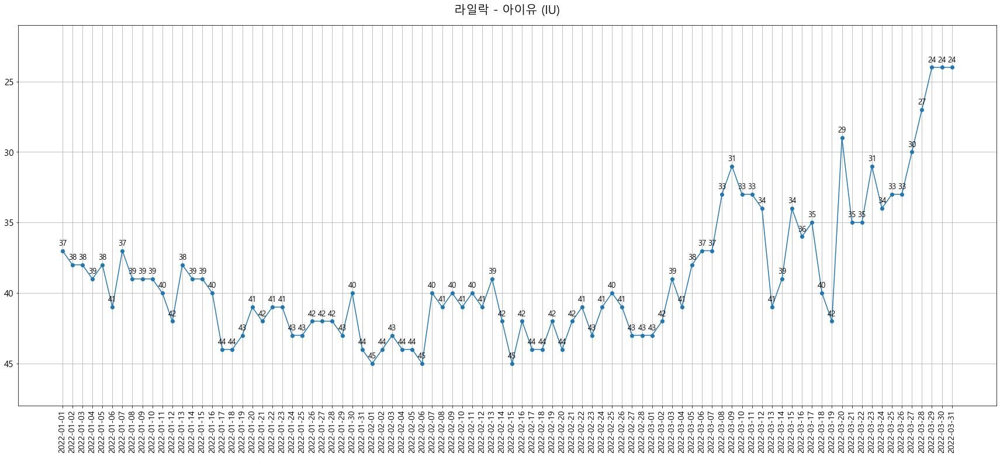

 37%|███▋      | 37/100 [00:42<01:13,  1.16s/it]

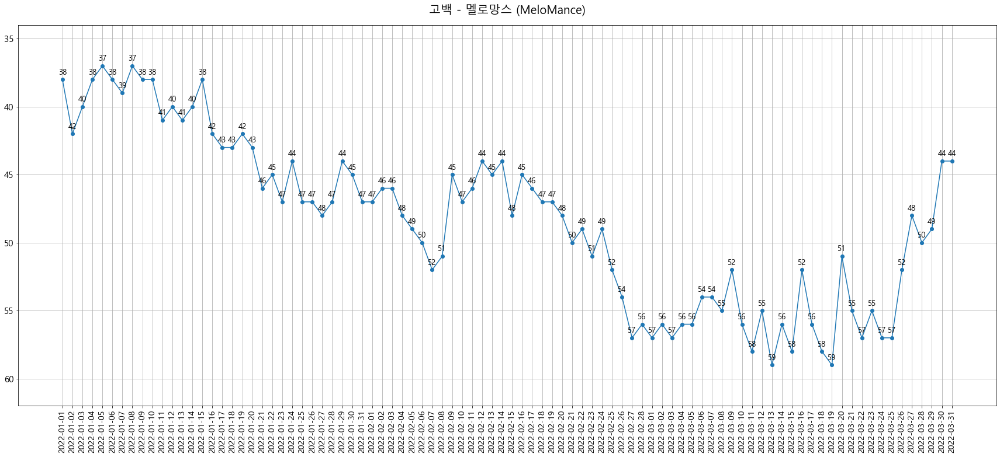

 38%|███▊      | 38/100 [00:43<01:12,  1.17s/it]

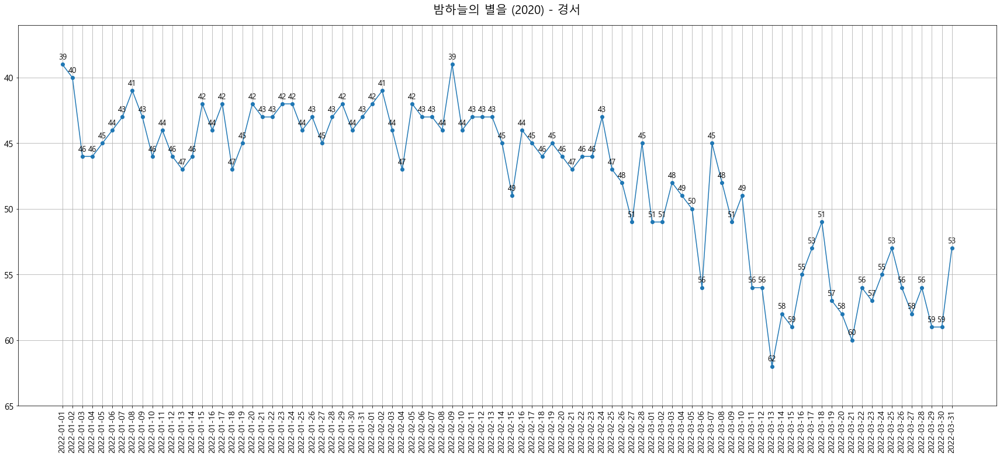

 39%|███▉      | 39/100 [00:44<01:11,  1.18s/it]

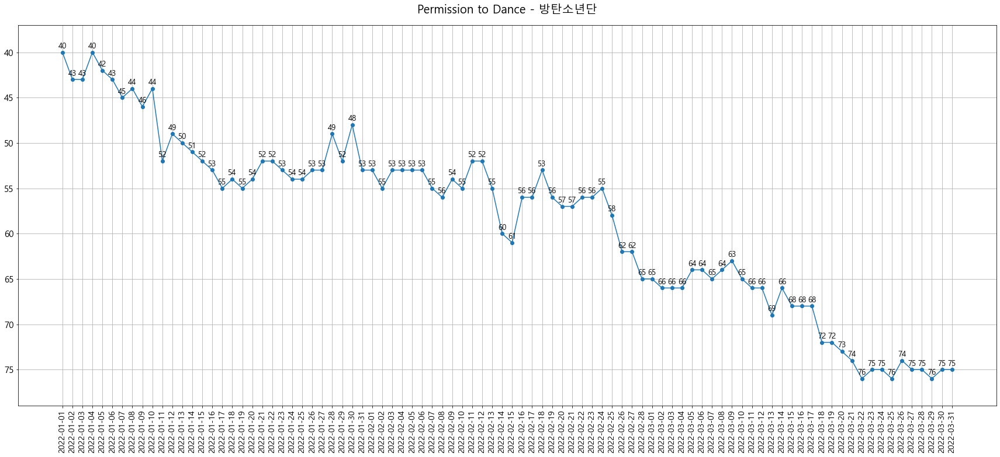

 40%|████      | 40/100 [00:45<01:10,  1.17s/it]

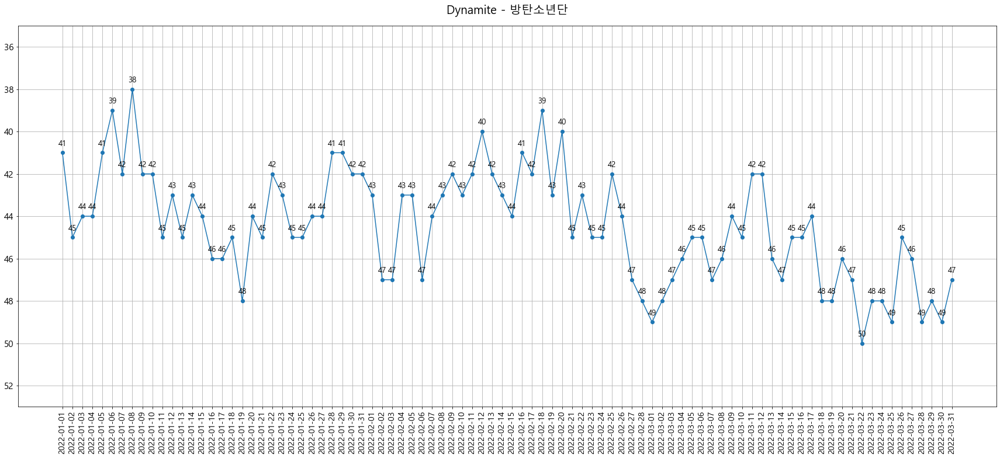

 41%|████      | 41/100 [00:46<01:09,  1.17s/it]

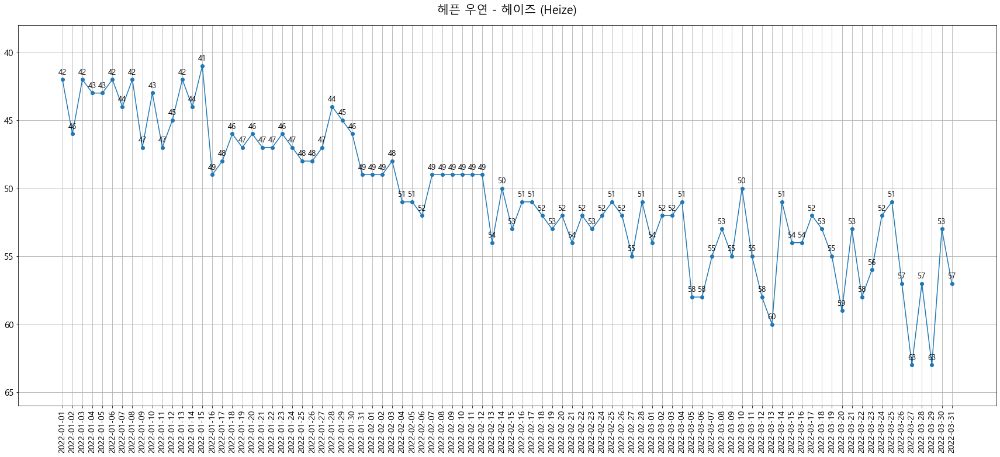

 42%|████▏     | 42/100 [00:48<01:09,  1.21s/it]

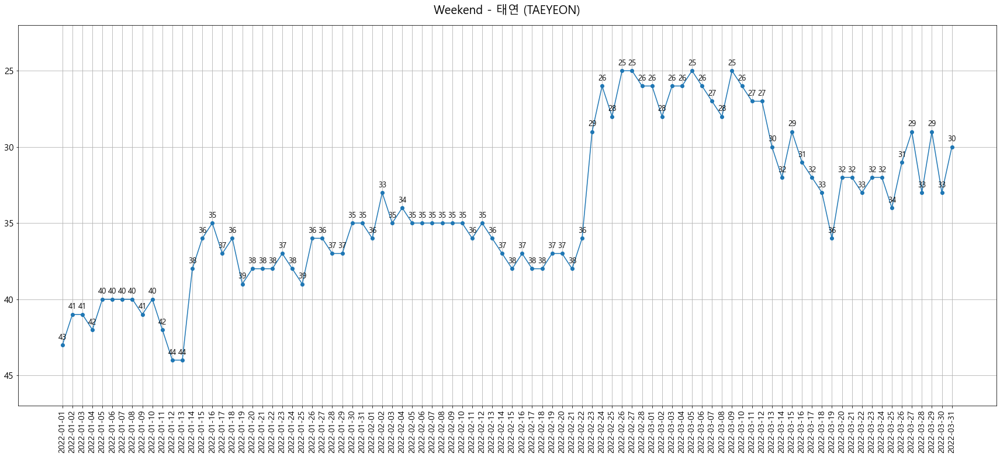

 43%|████▎     | 43/100 [00:49<01:11,  1.25s/it]

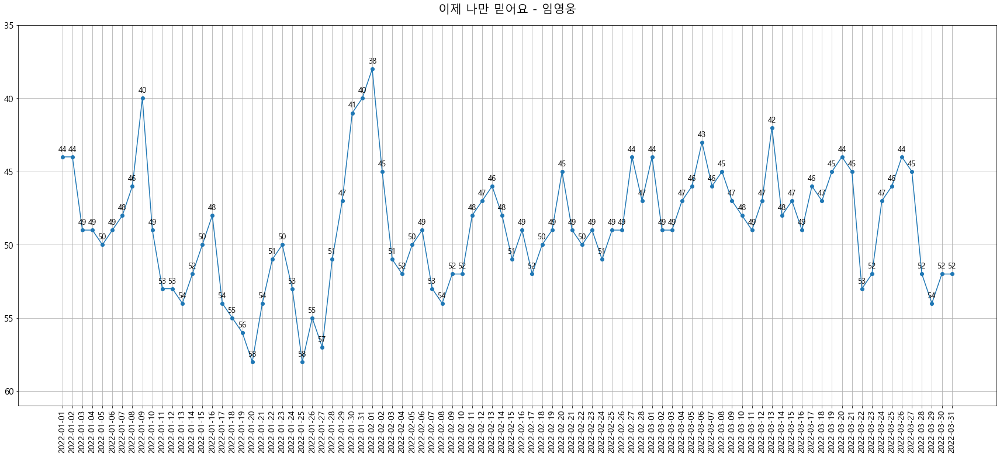

 44%|████▍     | 44/100 [00:50<01:09,  1.24s/it]

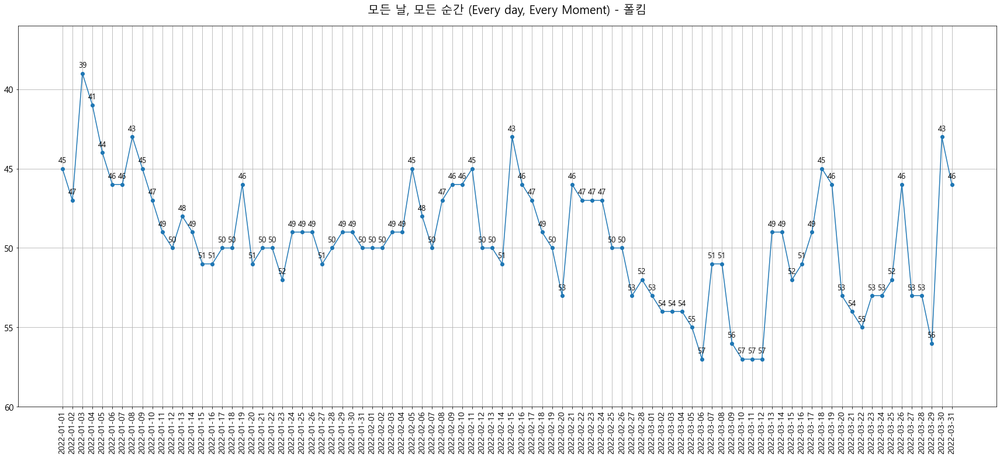

 45%|████▌     | 45/100 [00:51<01:06,  1.21s/it]

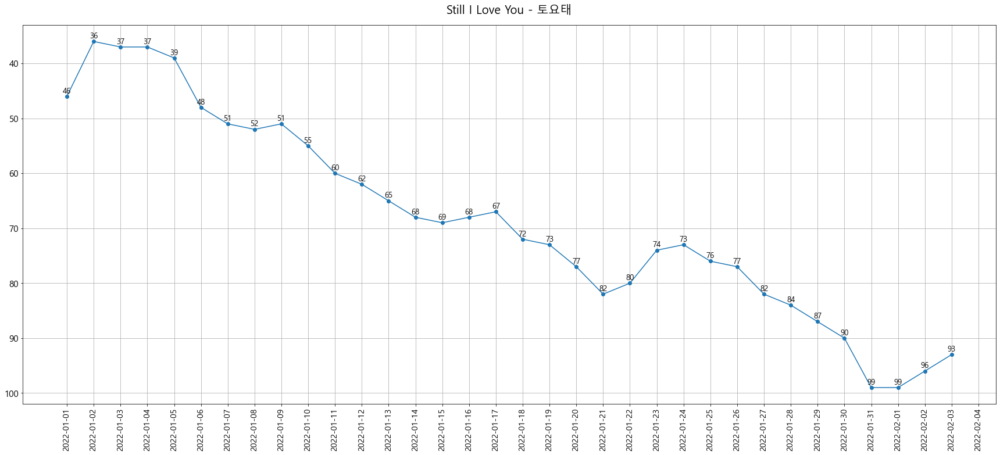

 46%|████▌     | 46/100 [00:52<00:53,  1.01it/s]

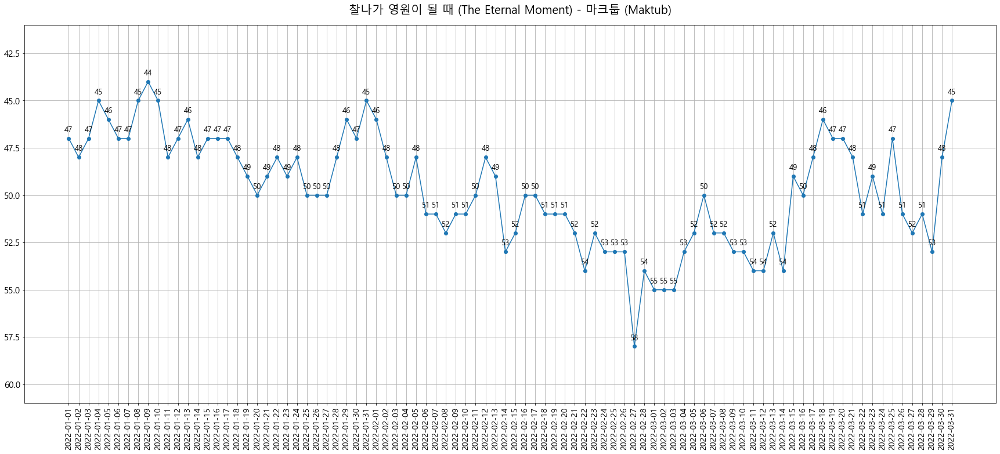

 47%|████▋     | 47/100 [00:53<00:57,  1.09s/it]

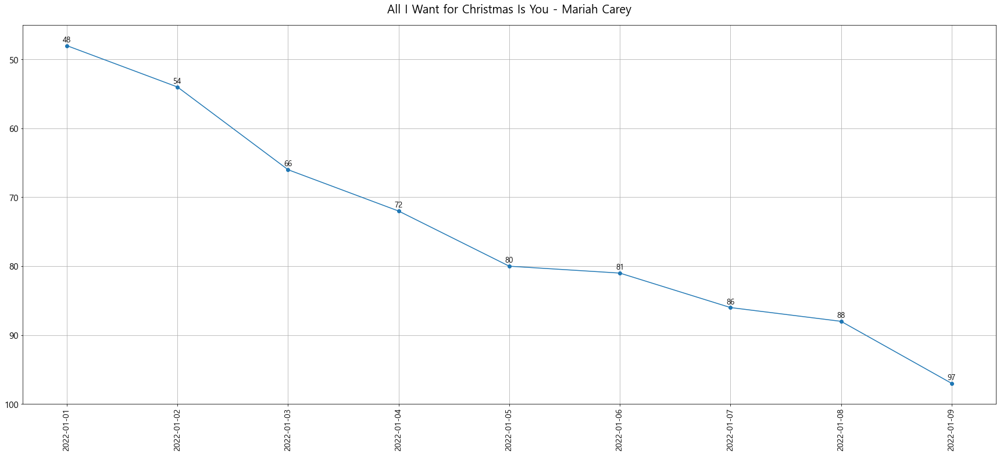

 48%|████▊     | 48/100 [00:53<00:43,  1.19it/s]

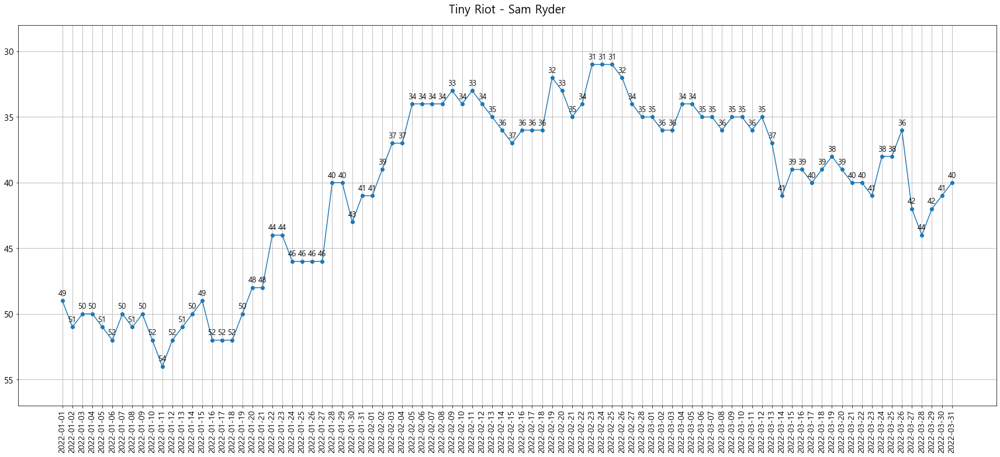

 49%|████▉     | 49/100 [00:55<00:48,  1.05it/s]

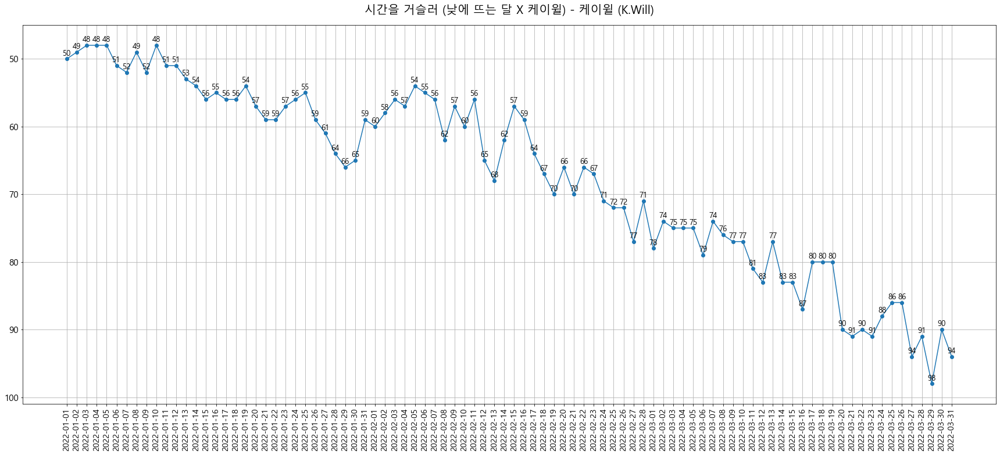

 50%|█████     | 50/100 [00:56<00:51,  1.03s/it]

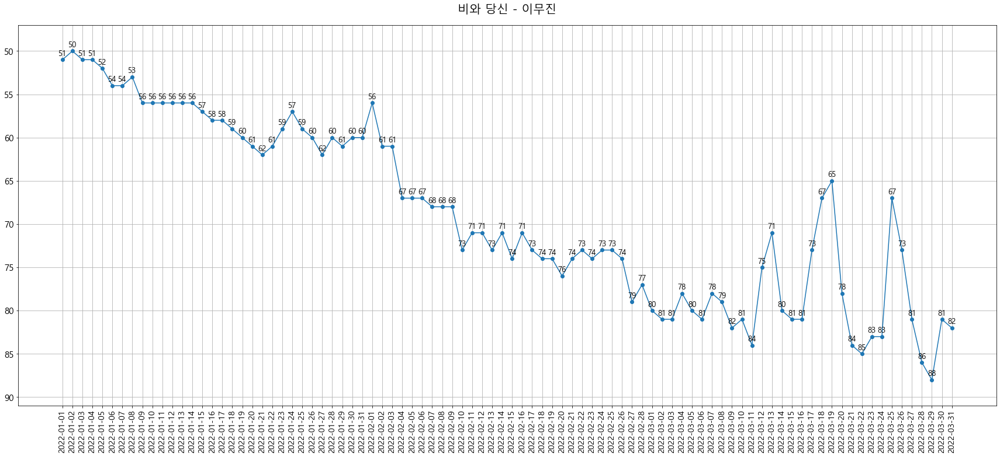

 51%|█████     | 51/100 [00:57<00:54,  1.11s/it]

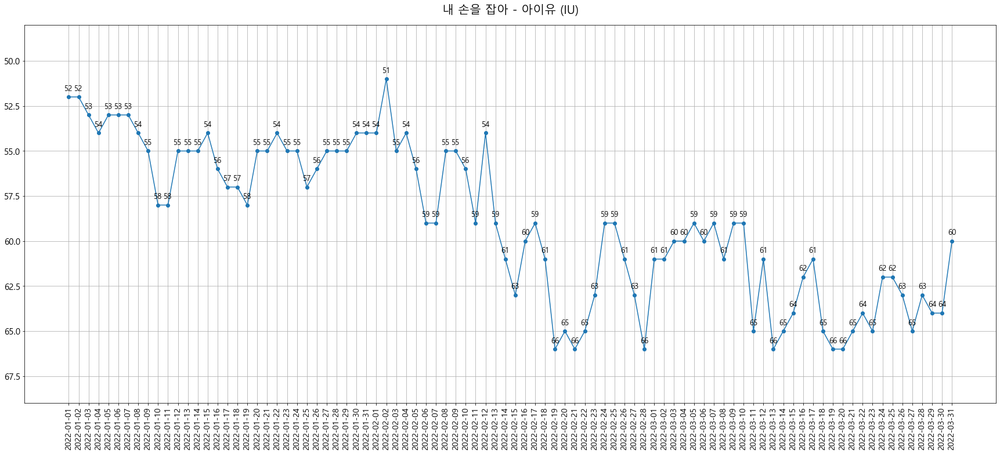

 52%|█████▏    | 52/100 [00:58<00:54,  1.13s/it]

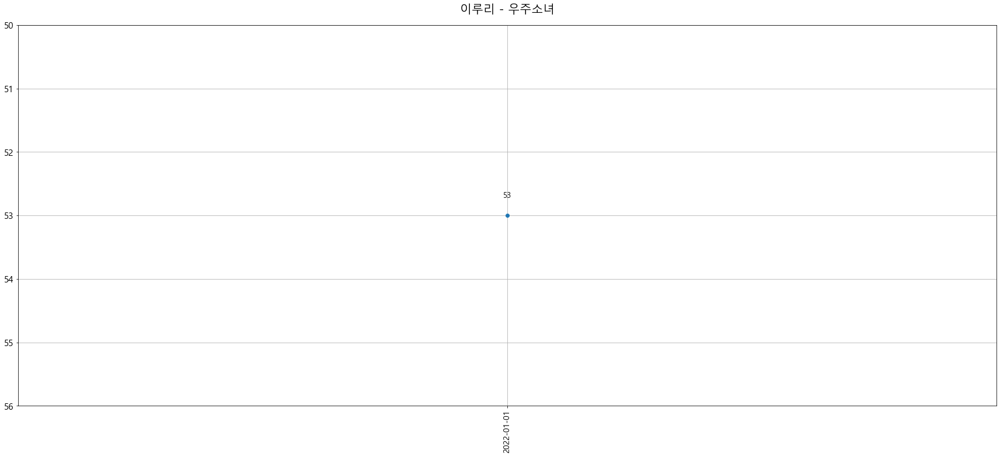

 53%|█████▎    | 53/100 [00:58<00:40,  1.17it/s]

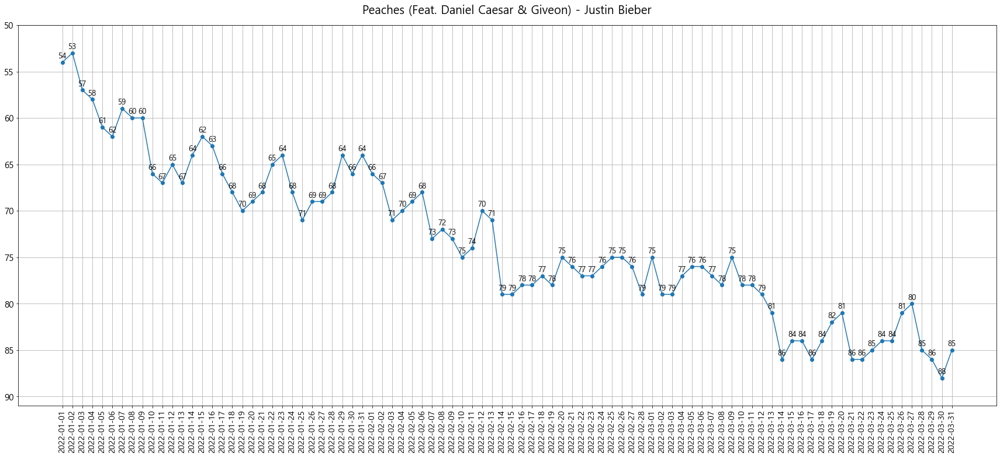

 54%|█████▍    | 54/100 [01:00<00:44,  1.04it/s]

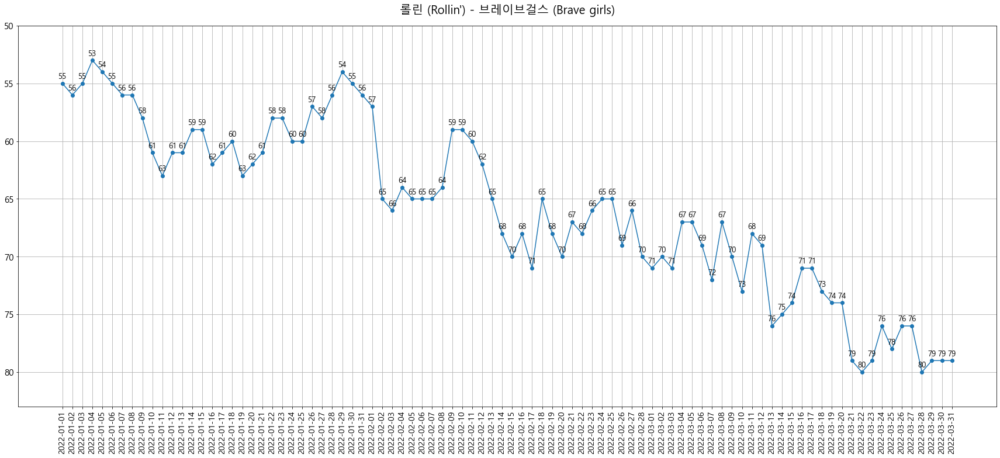

 55%|█████▌    | 55/100 [01:01<00:46,  1.03s/it]

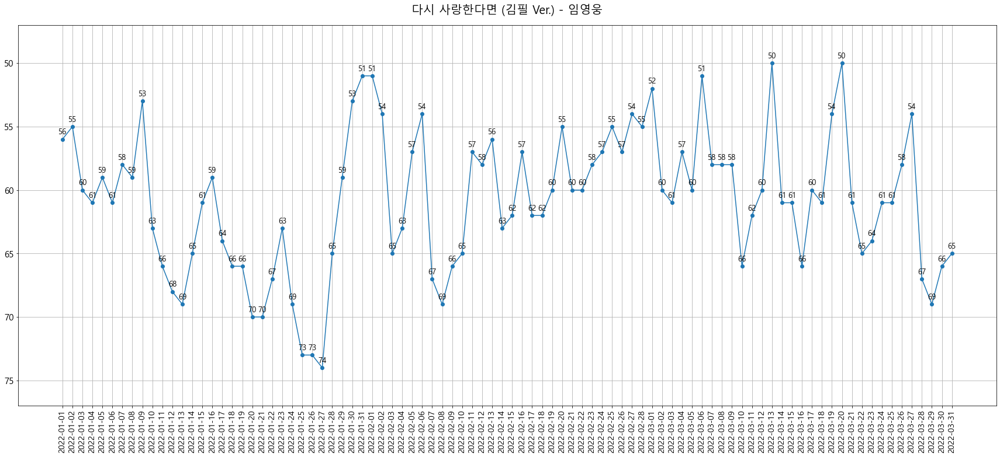

 56%|█████▌    | 56/100 [01:02<00:48,  1.09s/it]

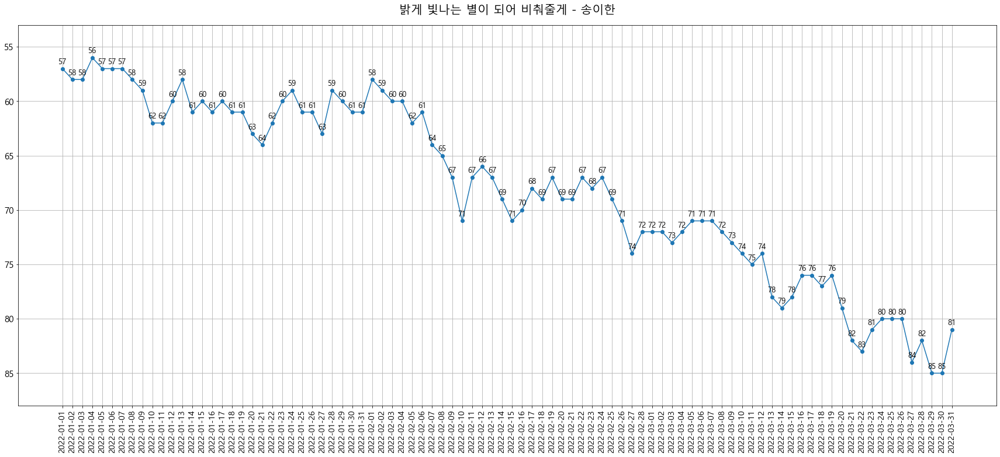

 57%|█████▋    | 57/100 [01:03<00:47,  1.11s/it]

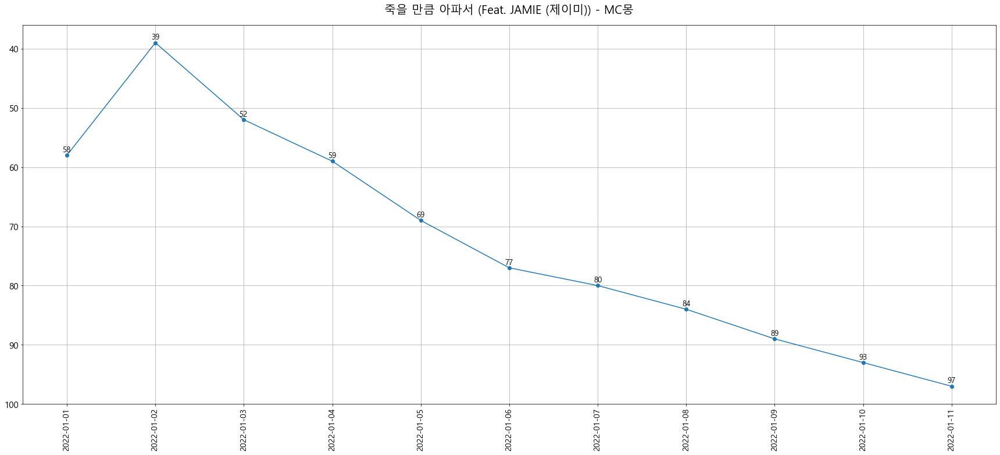

 58%|█████▊    | 58/100 [01:04<00:36,  1.16it/s]

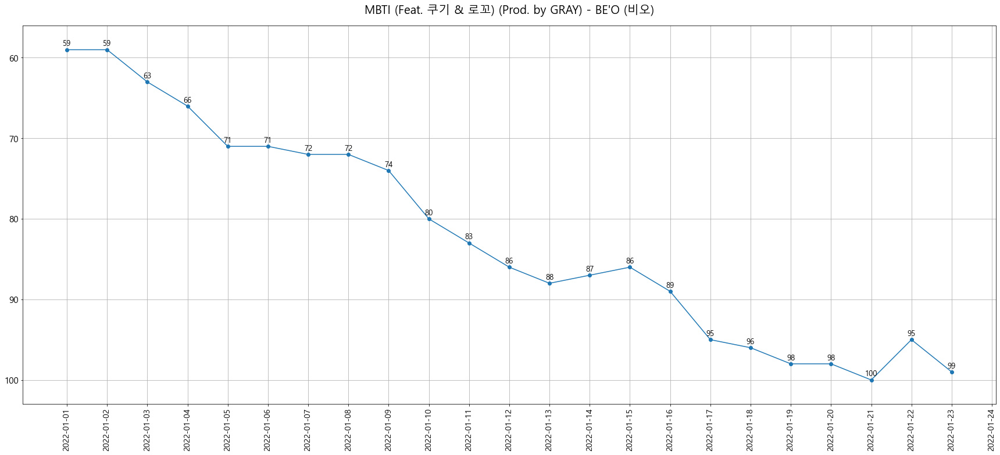

 59%|█████▉    | 59/100 [01:04<00:29,  1.38it/s]

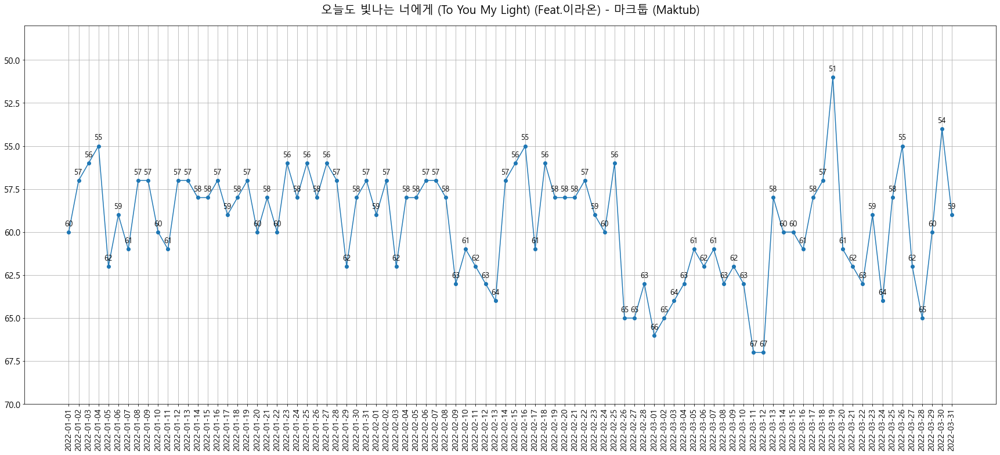

 60%|██████    | 60/100 [01:05<00:34,  1.16it/s]

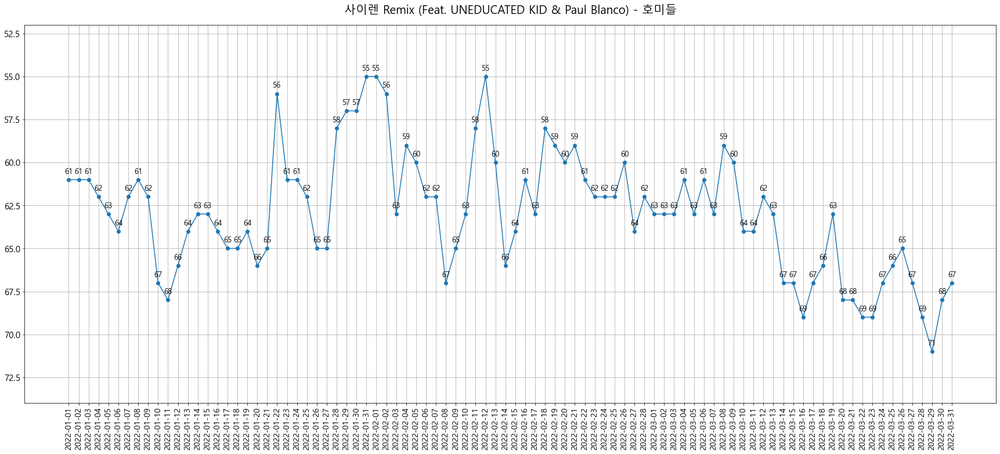

 61%|██████    | 61/100 [01:06<00:37,  1.04it/s]

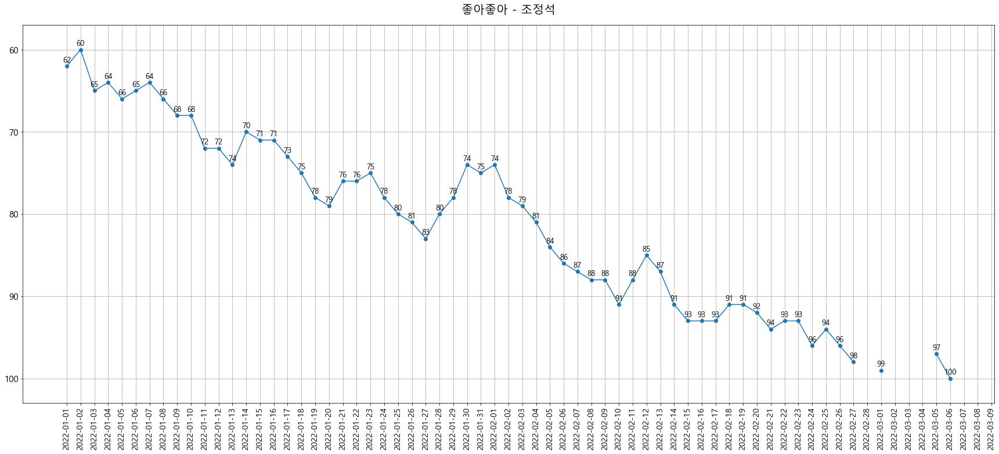

 62%|██████▏   | 62/100 [01:07<00:36,  1.04it/s]

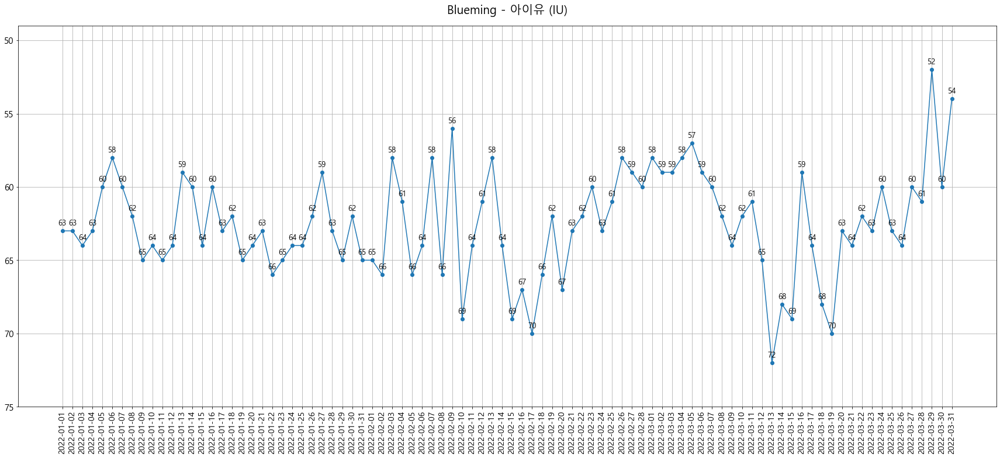

 63%|██████▎   | 63/100 [01:09<00:38,  1.04s/it]

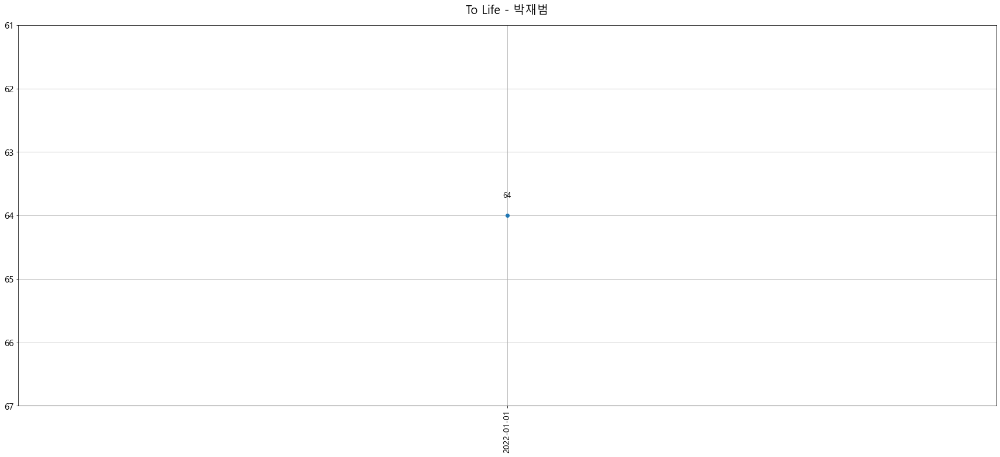

 64%|██████▍   | 64/100 [01:09<00:28,  1.25it/s]

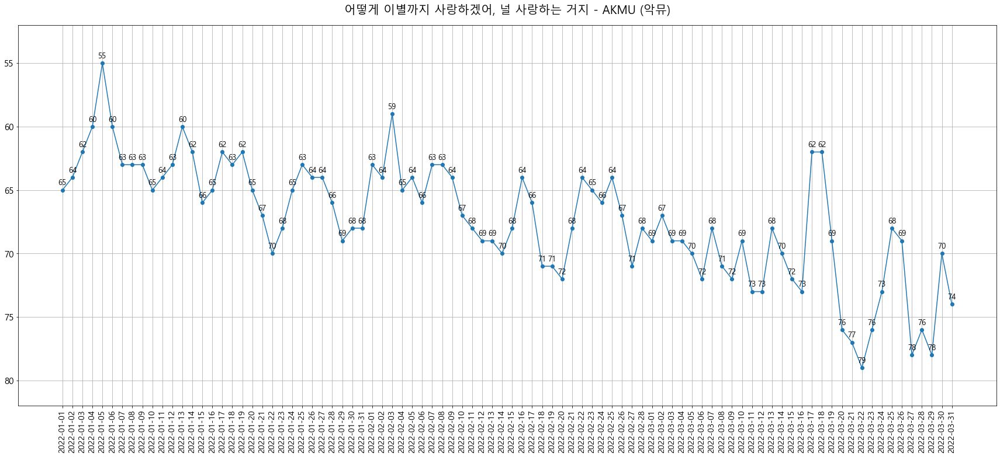

 65%|██████▌   | 65/100 [01:10<00:31,  1.09it/s]

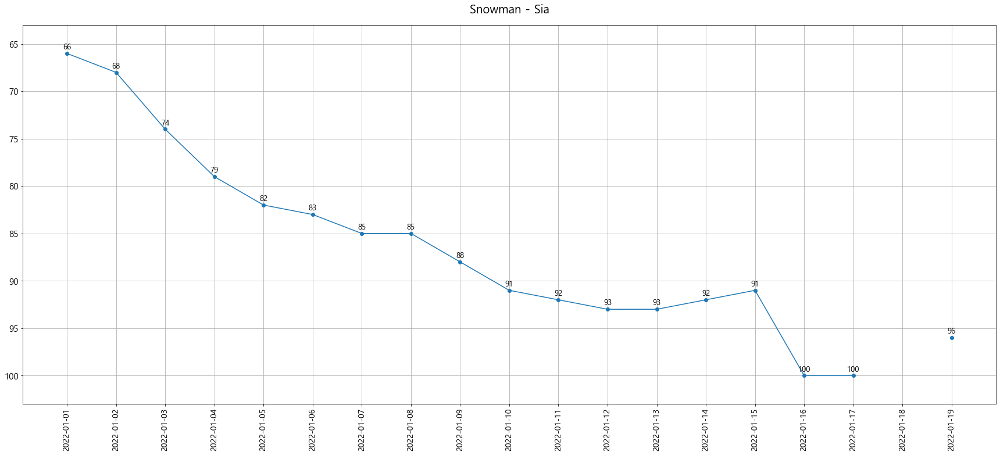

 66%|██████▌   | 66/100 [01:10<00:25,  1.35it/s]

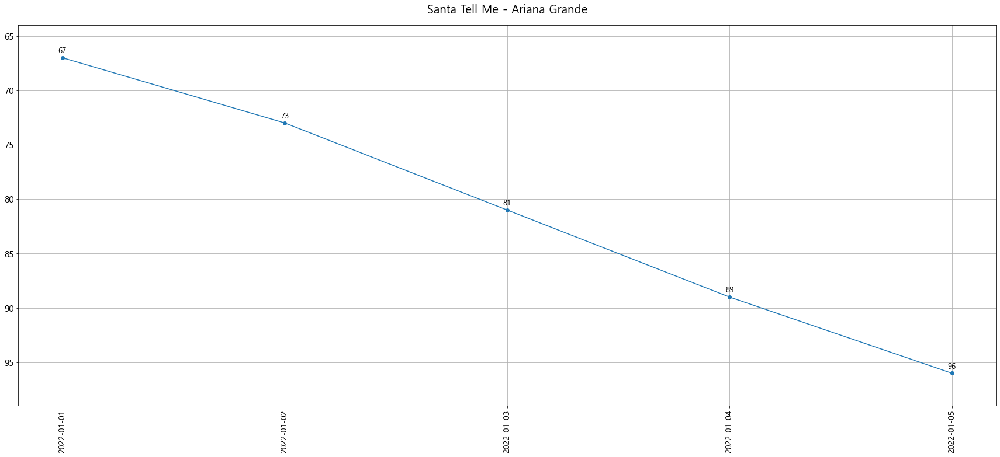

 67%|██████▋   | 67/100 [01:11<00:20,  1.64it/s]

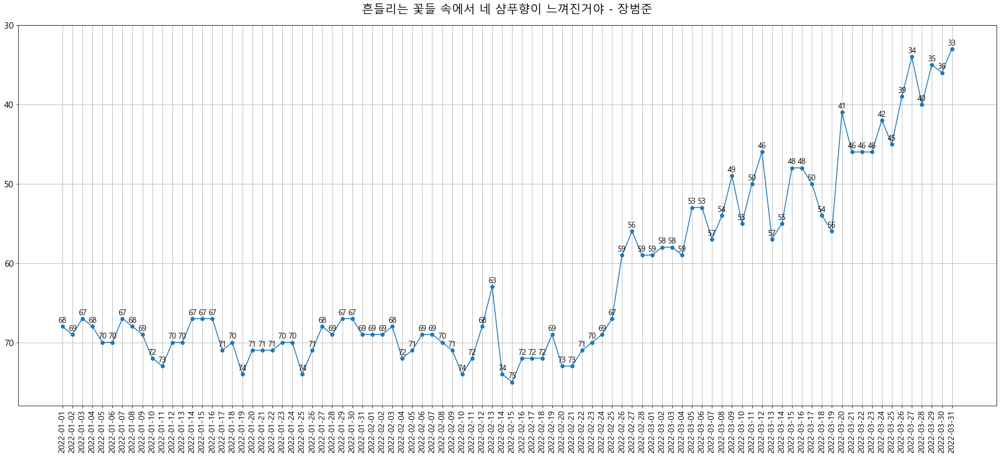

 68%|██████▊   | 68/100 [01:12<00:24,  1.29it/s]

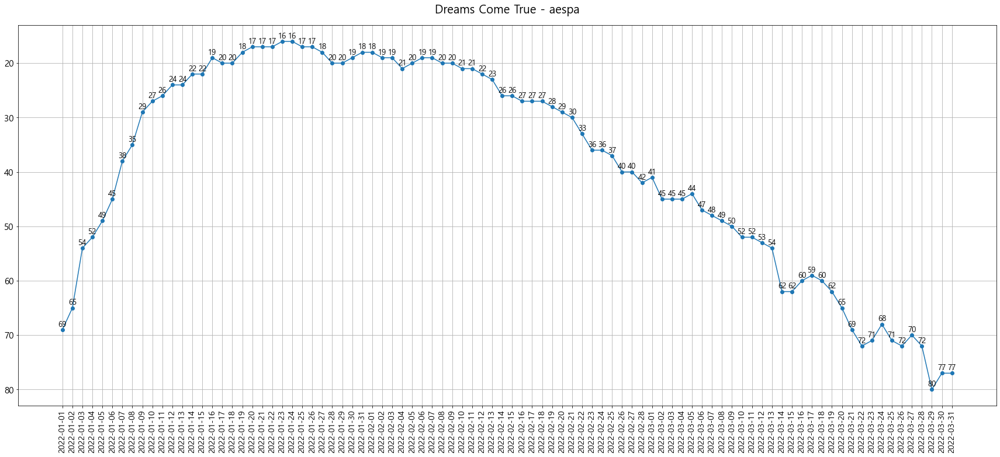

 69%|██████▉   | 69/100 [01:13<00:27,  1.13it/s]

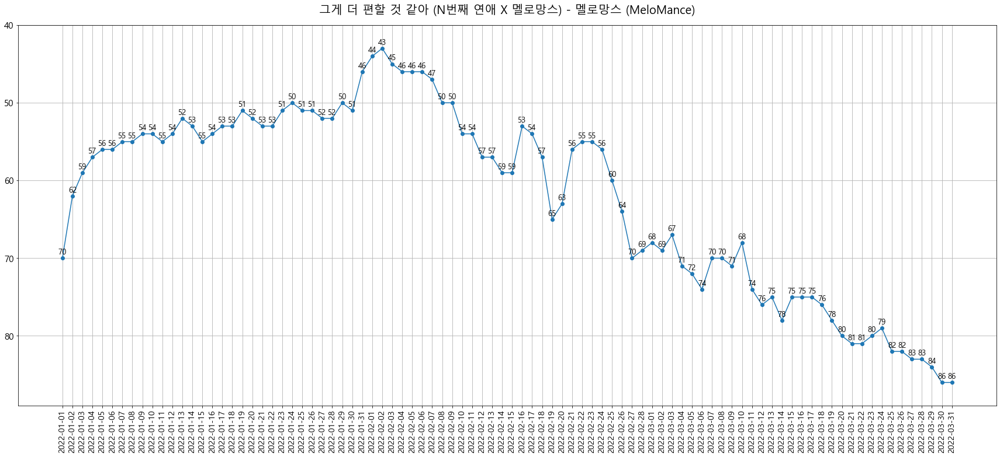

 70%|███████   | 70/100 [01:14<00:29,  1.02it/s]

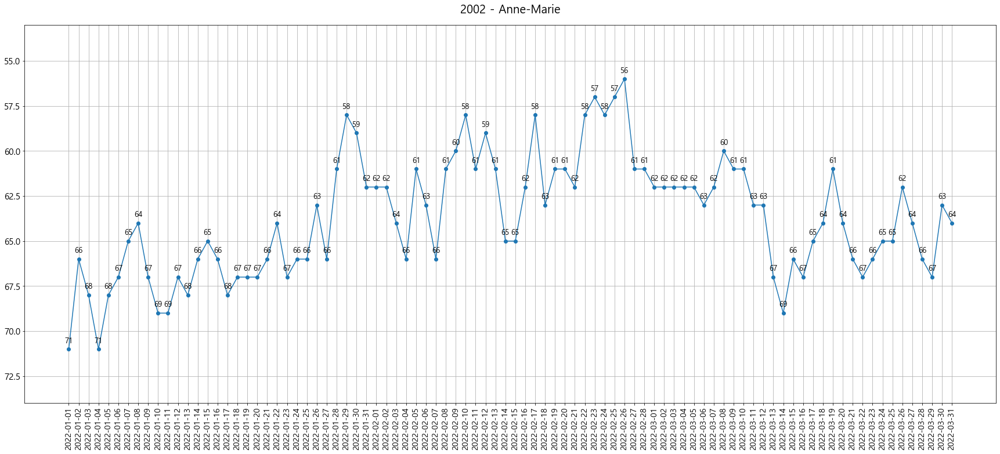

 71%|███████   | 71/100 [01:15<00:31,  1.07s/it]

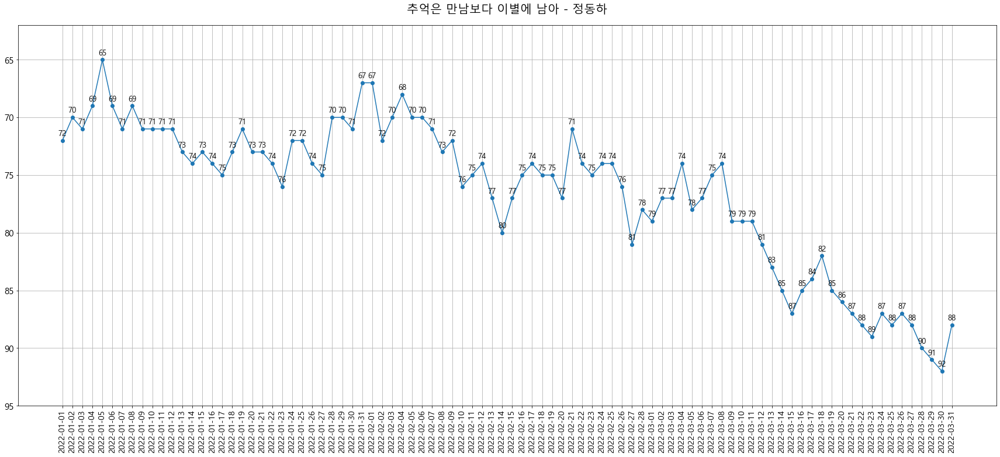

 72%|███████▏  | 72/100 [01:17<00:30,  1.10s/it]

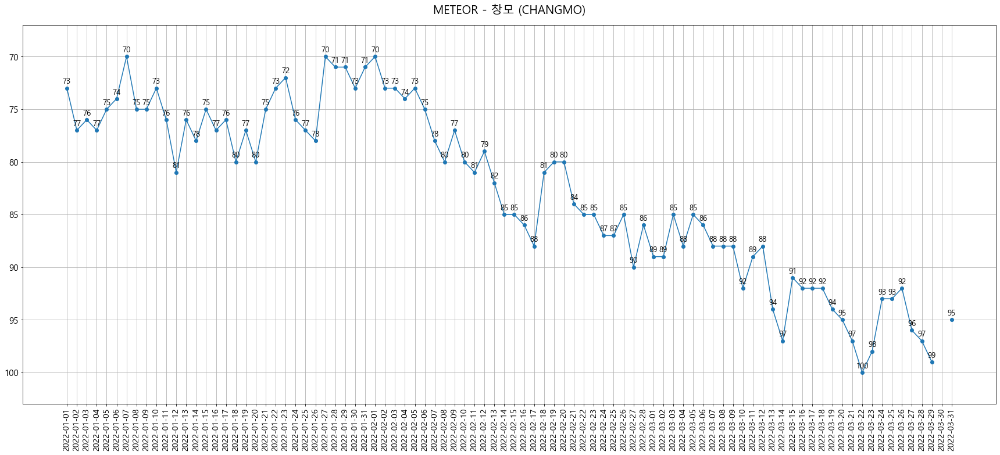

 73%|███████▎  | 73/100 [01:18<00:30,  1.12s/it]

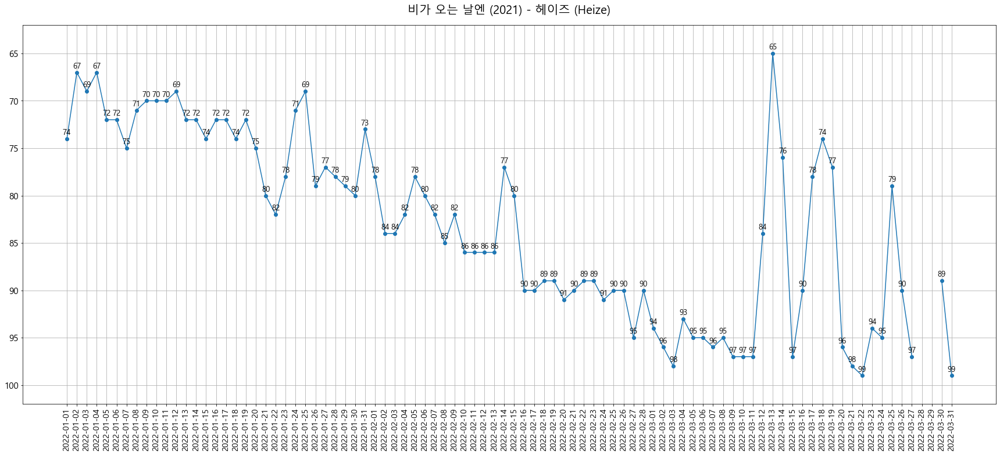

 74%|███████▍  | 74/100 [01:19<00:29,  1.13s/it]

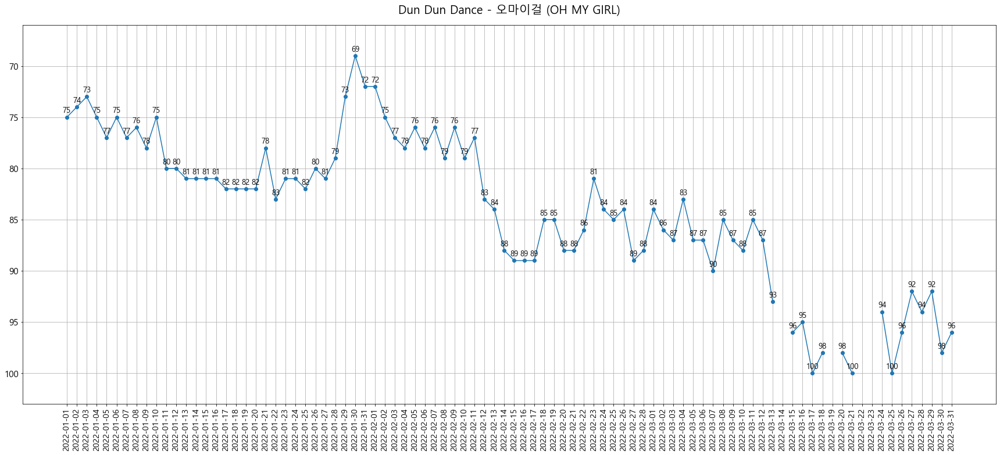

 75%|███████▌  | 75/100 [01:20<00:28,  1.14s/it]

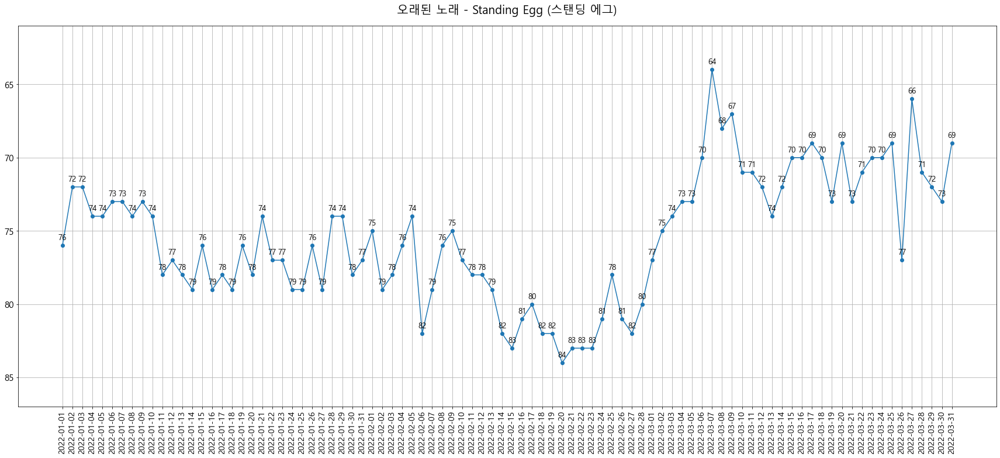

 76%|███████▌  | 76/100 [01:21<00:27,  1.15s/it]

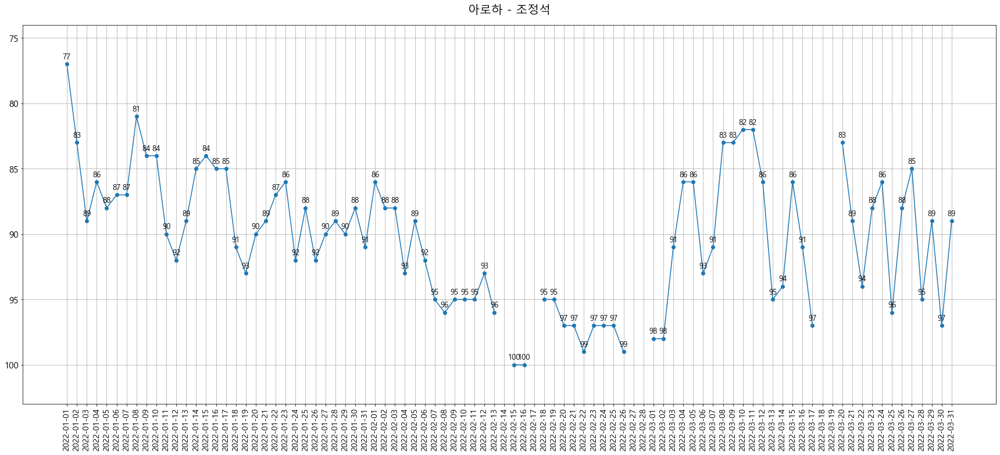

 77%|███████▋  | 77/100 [01:22<00:26,  1.15s/it]

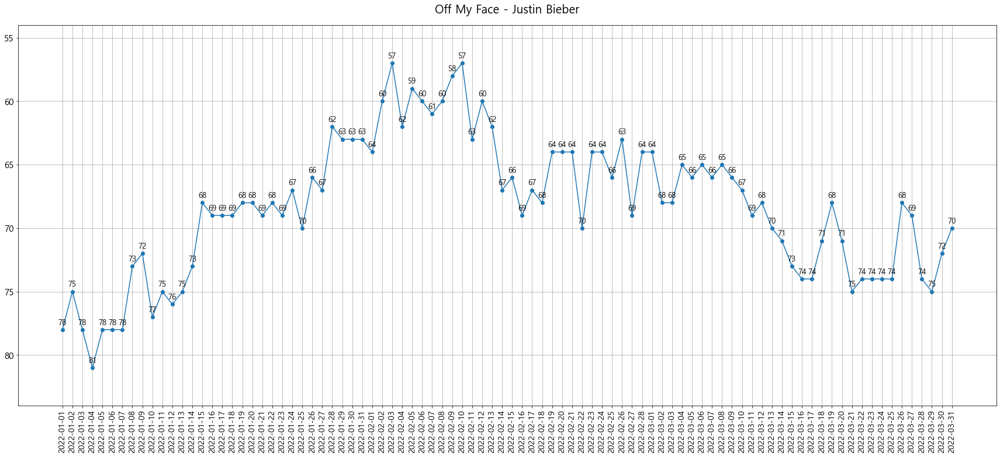

 78%|███████▊  | 78/100 [01:24<00:25,  1.17s/it]

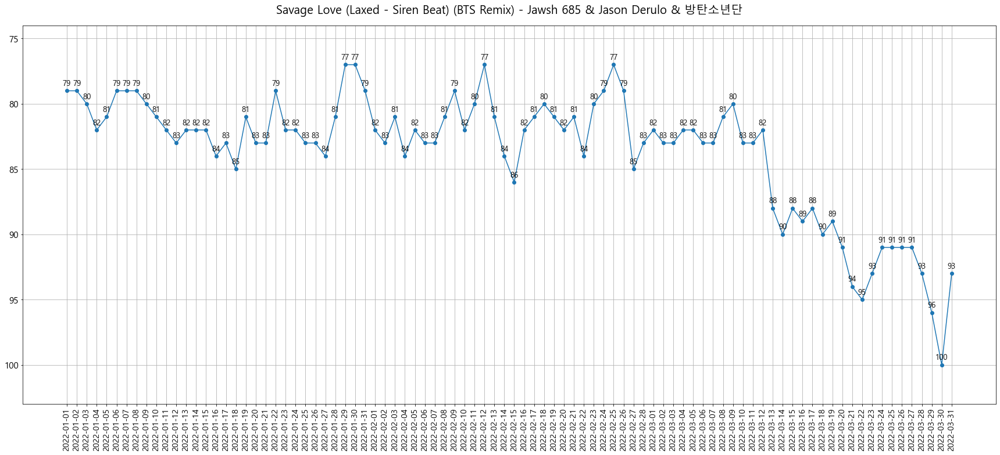

 79%|███████▉  | 79/100 [01:25<00:24,  1.18s/it]

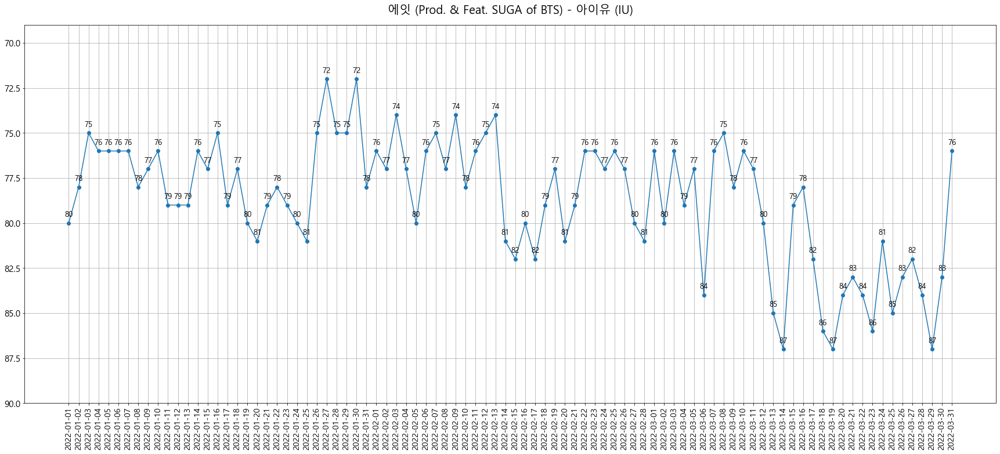

 80%|████████  | 80/100 [01:26<00:23,  1.18s/it]

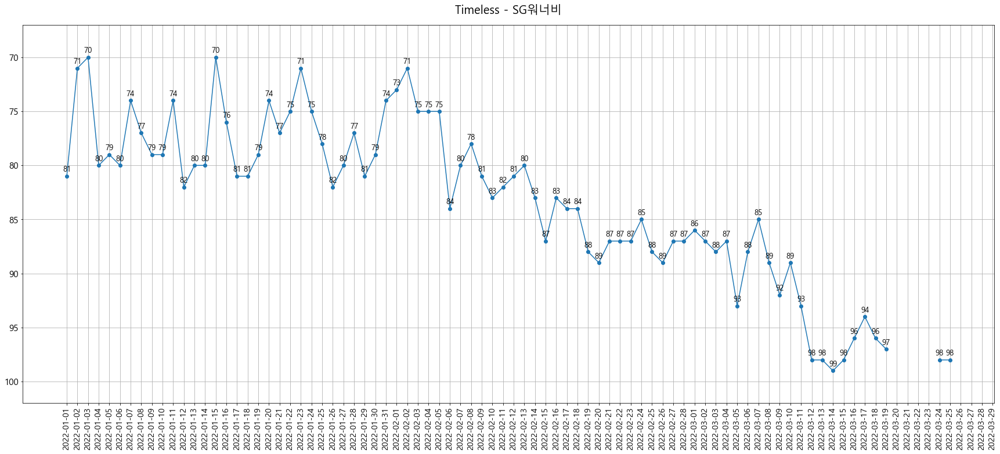

 81%|████████  | 81/100 [01:27<00:21,  1.16s/it]

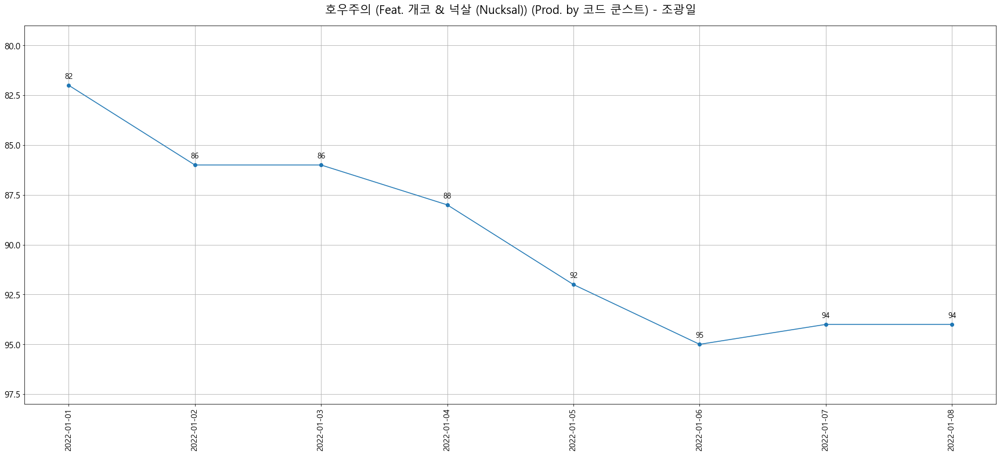

 82%|████████▏ | 82/100 [01:27<00:16,  1.10it/s]

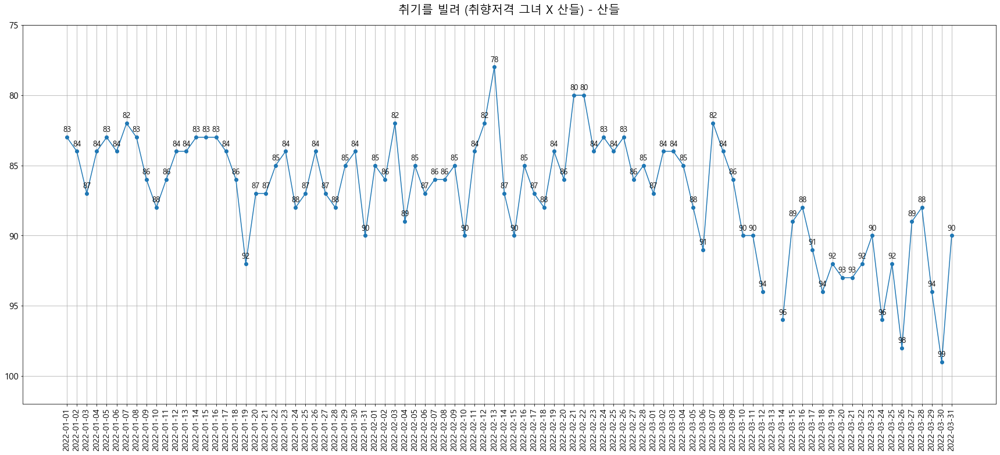

 83%|████████▎ | 83/100 [01:29<00:16,  1.02it/s]

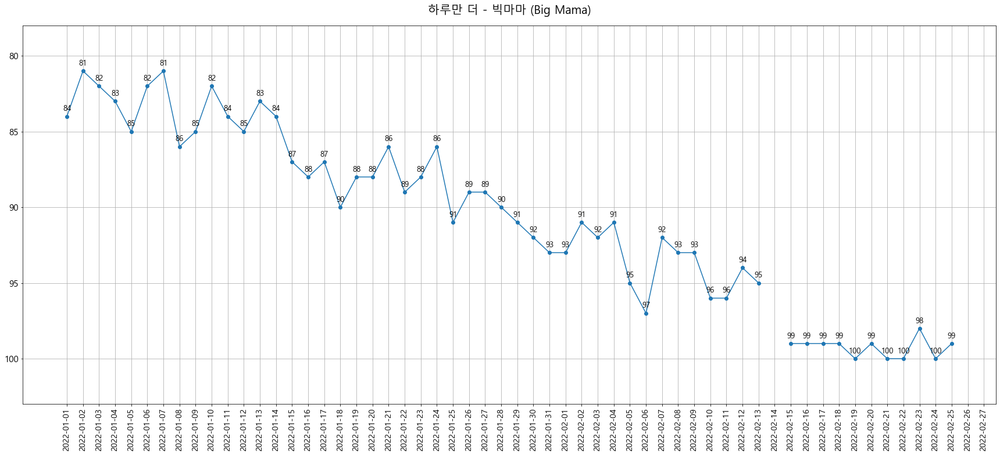

 84%|████████▍ | 84/100 [01:29<00:15,  1.06it/s]

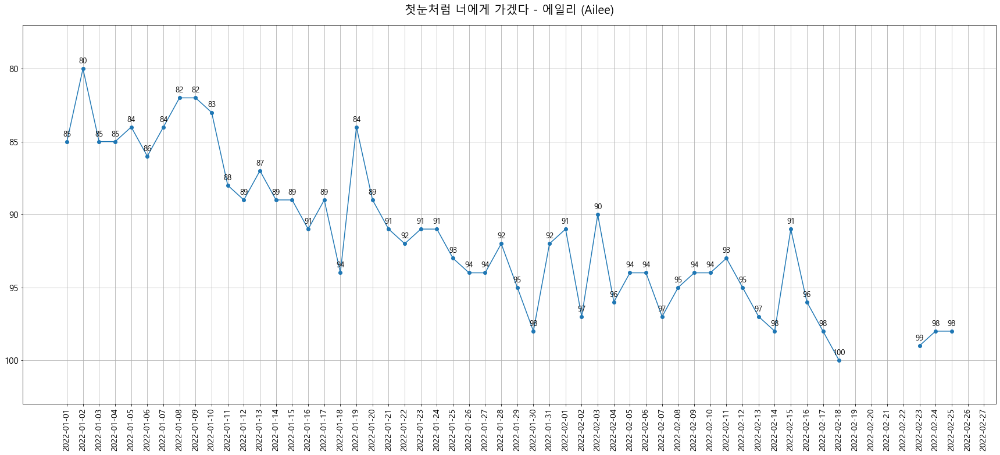

 85%|████████▌ | 85/100 [01:30<00:13,  1.11it/s]

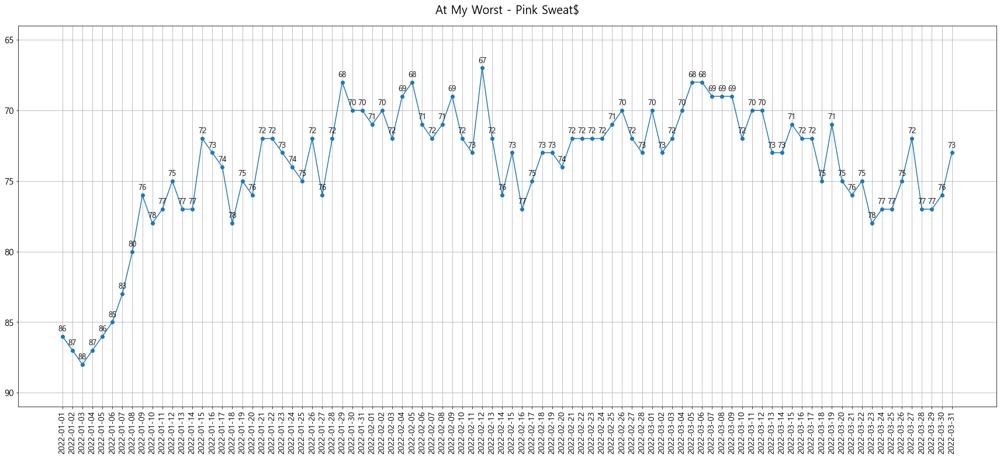

 86%|████████▌ | 86/100 [01:31<00:13,  1.01it/s]

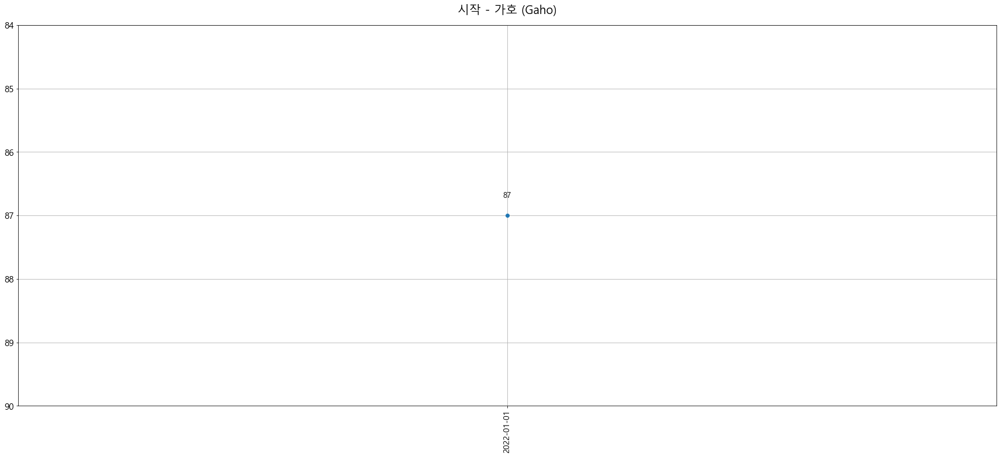

 87%|████████▋ | 87/100 [01:32<00:09,  1.31it/s]

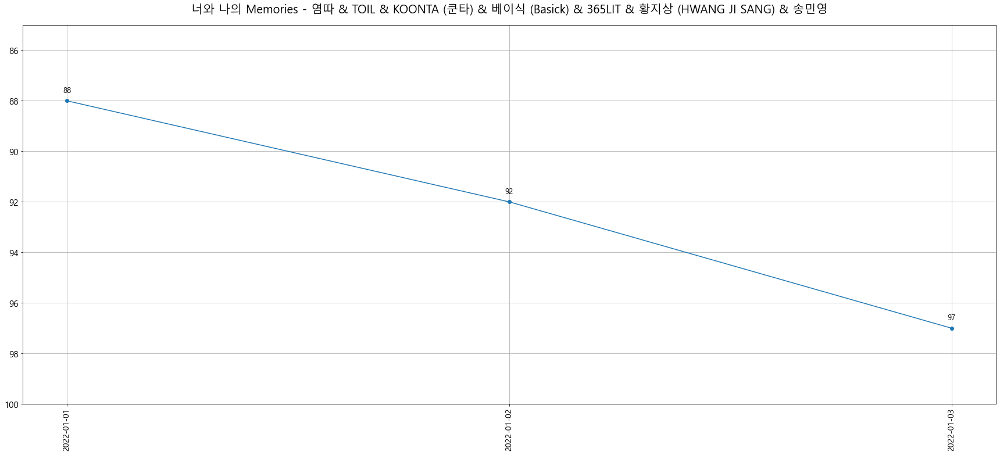

 88%|████████▊ | 88/100 [01:32<00:07,  1.64it/s]

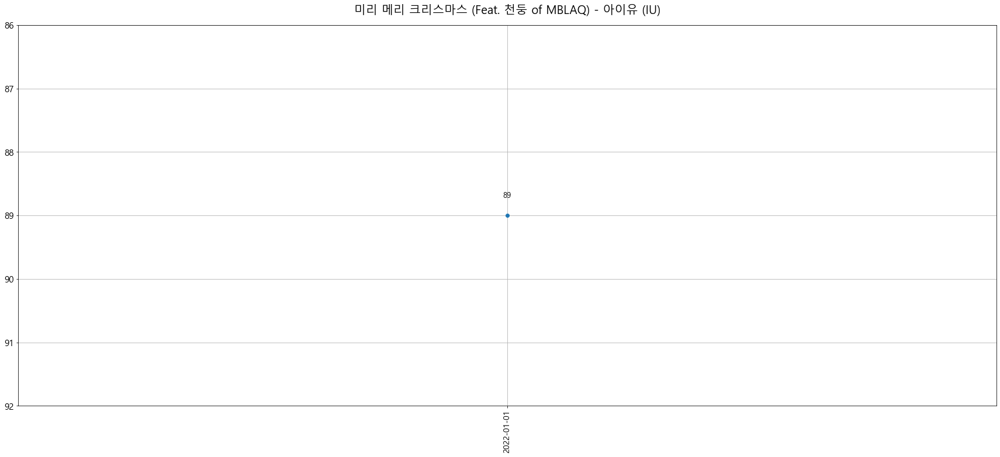

 89%|████████▉ | 89/100 [01:32<00:05,  2.00it/s]

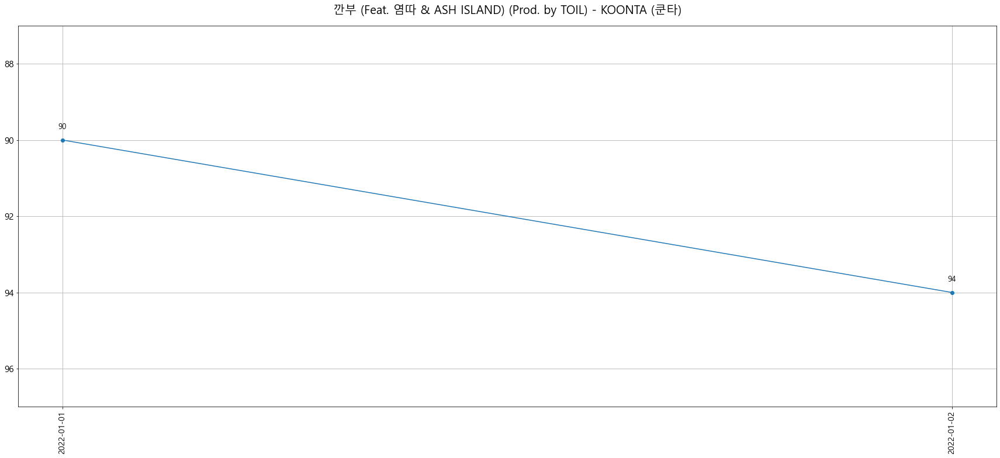

 90%|█████████ | 90/100 [01:32<00:04,  2.39it/s]

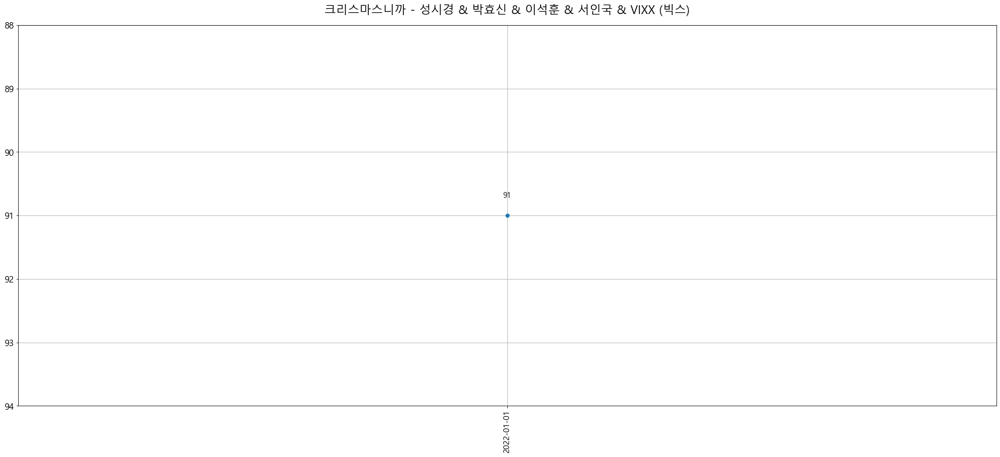

 91%|█████████ | 91/100 [01:33<00:03,  2.64it/s]

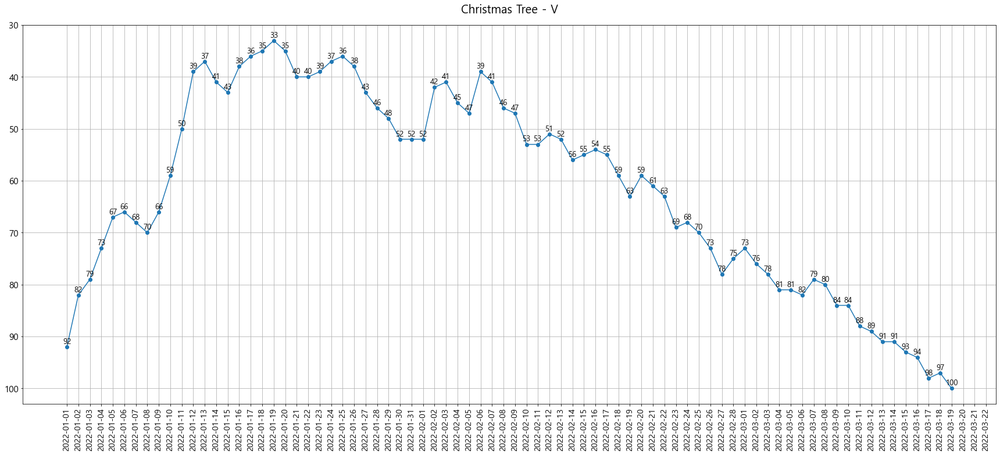

 92%|█████████▏| 92/100 [01:34<00:04,  1.70it/s]

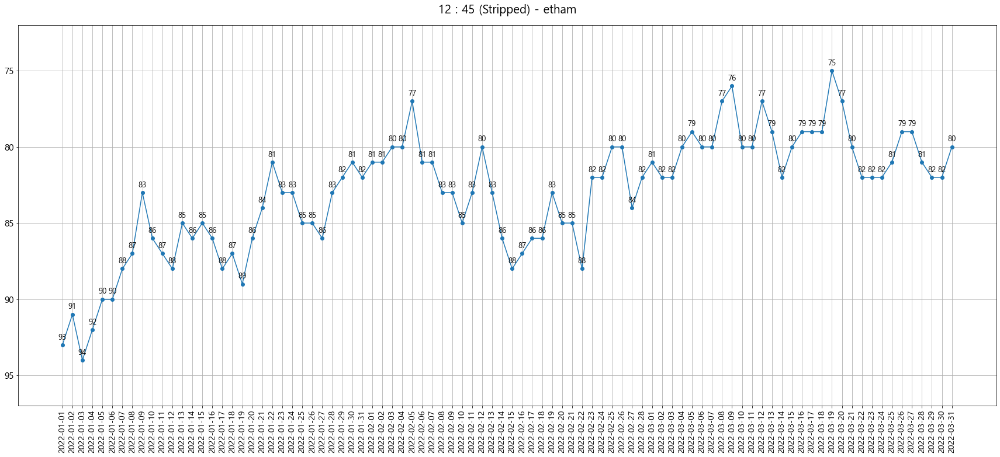

 93%|█████████▎| 93/100 [01:35<00:05,  1.32it/s]

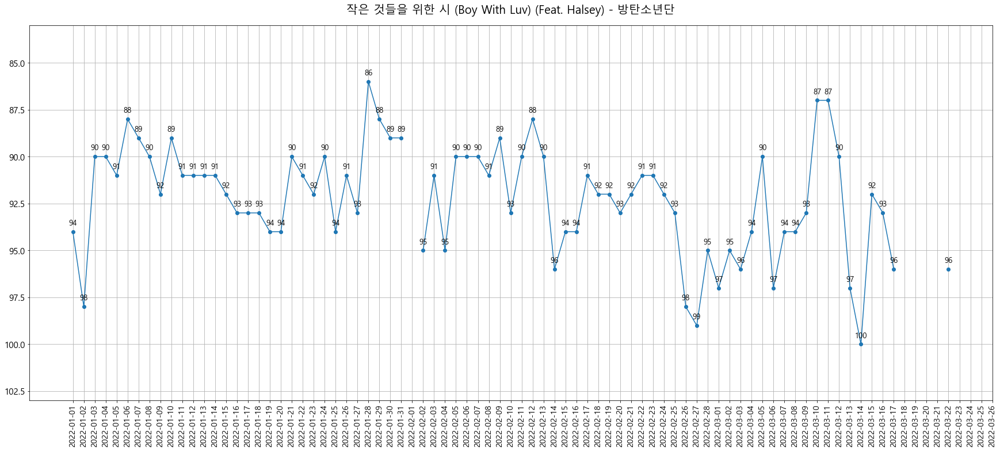

 94%|█████████▍| 94/100 [01:36<00:05,  1.17it/s]

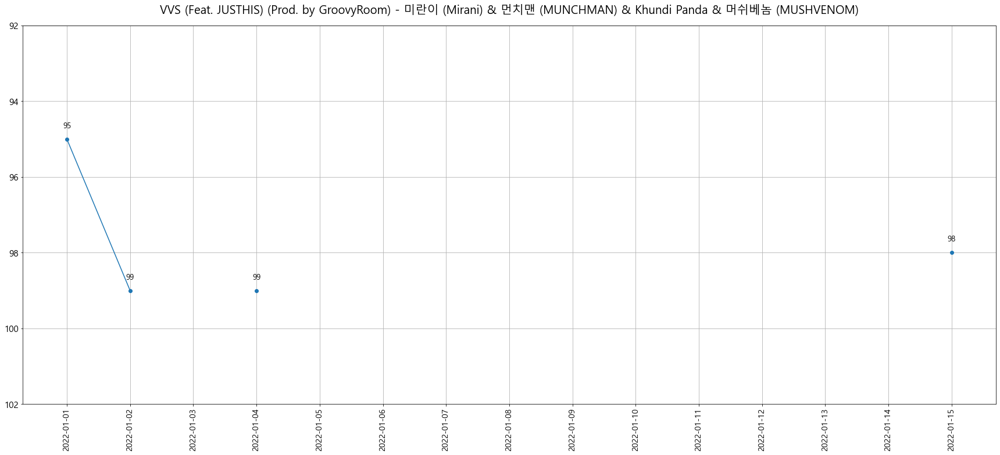

 95%|█████████▌| 95/100 [01:36<00:03,  1.43it/s]

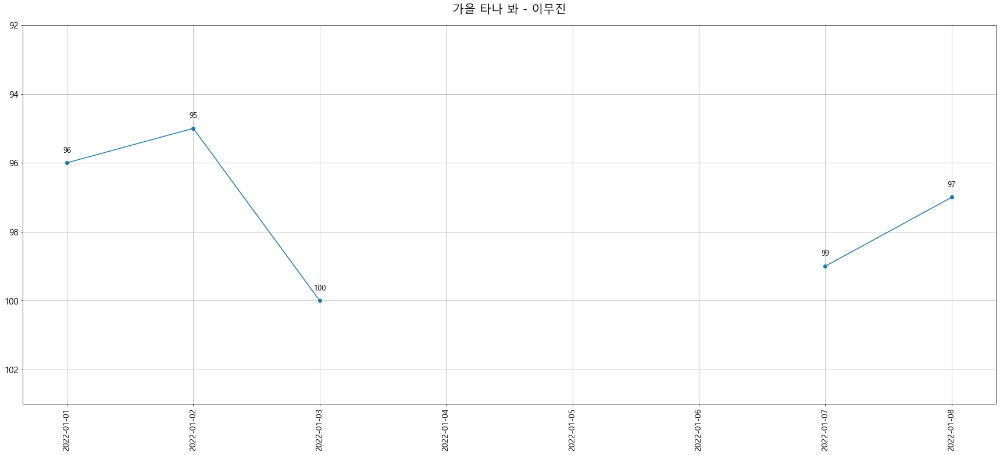

 96%|█████████▌| 96/100 [01:37<00:02,  1.77it/s]

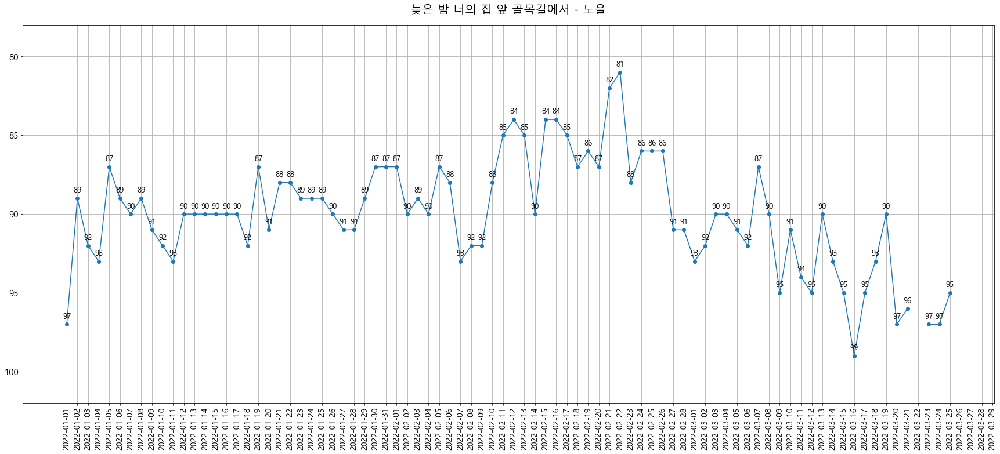

 97%|█████████▋| 97/100 [01:38<00:02,  1.36it/s]

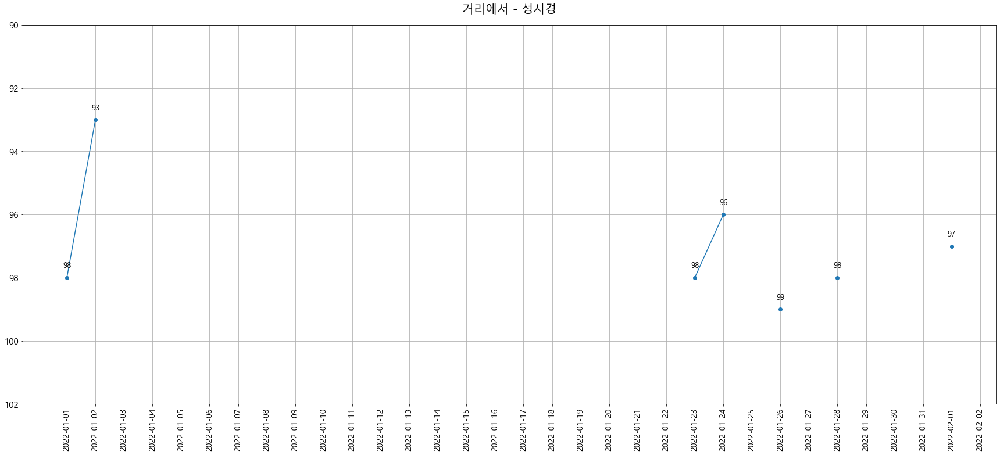

 98%|█████████▊| 98/100 [01:38<00:01,  1.63it/s]

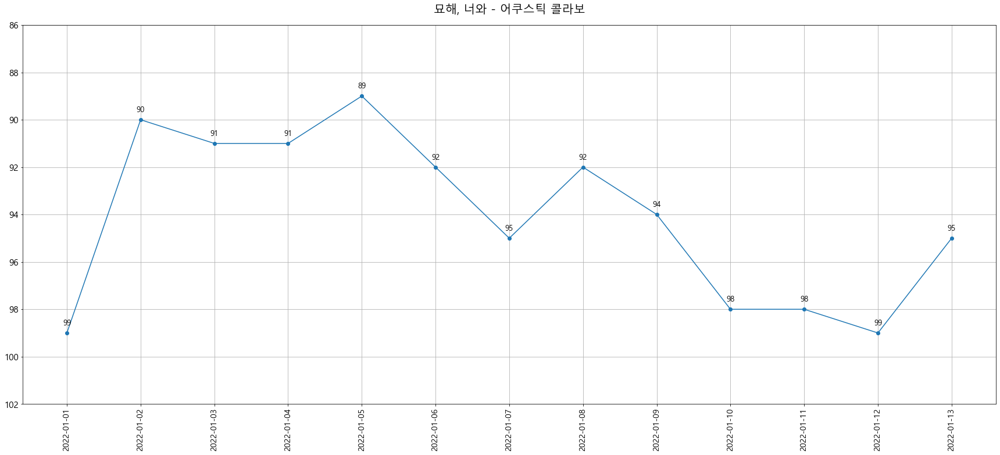

 99%|█████████▉| 99/100 [01:38<00:00,  1.93it/s]

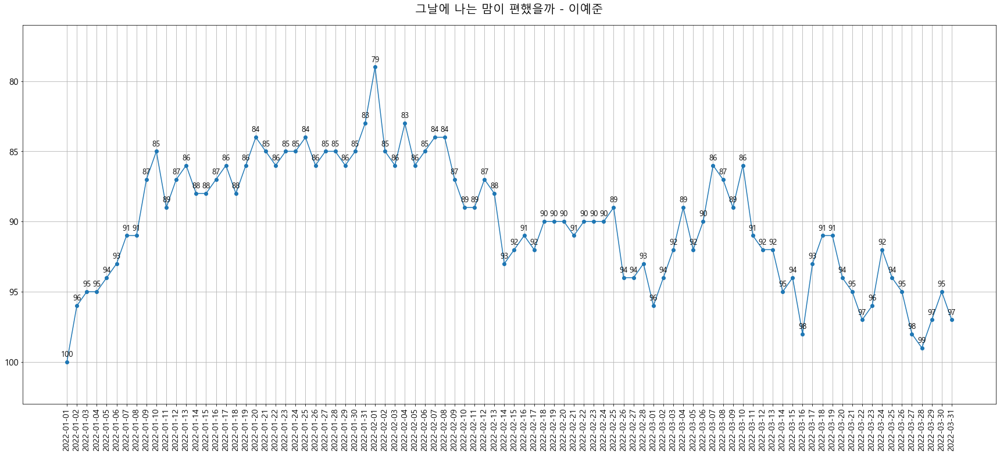

100%|██████████| 100/100 [01:39<00:00,  1.00it/s]


In [26]:
for one in tqdm(df['곡'][:100]):
    sort_df = df[df['곡'] == one].reset_index(drop=True)
    sort_set = merge_set(sort_df)
    graph(sort_set)

# 그래프 하나로 시각화

In [35]:
for one in tqdm(df['곡'][95:98]):
    sort_df = df[df['곡'] == one].reset_index(drop=True)
    sort_set = merge_set(sort_df)
sort_set

100%|██████████| 3/3 [00:00<00:00, 188.00it/s]


,날짜,순위,곡,가수,앨범
0,2022-01-01,98.0,거리에서,성시경,The Ballads
1,2022-01-02,93.0,거리에서,성시경,The Ballads
2,2022-01-03,NaN,NaN,NaN,NaN
3,2022-01-04,NaN,NaN,NaN,NaN
4,2022-01-05,NaN,NaN,NaN,NaN
...,...,...,...,...,...
85,2022-03-27,NaN,NaN,NaN,NaN
86,2022-03-28,NaN,NaN,NaN,NaN
87,2022-03-29,NaN,NaN,NaN,NaN
88,2022-03-30,NaN,NaN,NaN,NaN


In [36]:
temp = sort_set['순위']
temp

0     98.0
1     93.0
2      NaN
3      NaN
4      NaN
      ... 
85     NaN
86     NaN
87     NaN
88     NaN
89     NaN
Name: 순위, Length: 90, dtype: float64

In [37]:
col = sort_set['곡'][0] + ' - ' + sort_set['가수'][0]
col

'거리에서 - 성시경'

In [38]:
temp = temp.rename(col)
temp

0     98.0
1     93.0
2      NaN
3      NaN
4      NaN
      ... 
85     NaN
86     NaN
87     NaN
88     NaN
89     NaN
Name: 거리에서 - 성시경, Length: 90, dtype: float64

In [39]:
basic_date_df

,날짜
0,2022-01-01
1,2022-01-02
2,2022-01-03
3,2022-01-04
4,2022-01-05
...,...
85,2022-03-27
86,2022-03-28
87,2022-03-29
88,2022-03-30


In [40]:
concat_df = pd.concat([basic_date_df, temp], axis=1)
concat_df

,날짜,거리에서 - 성시경
0,2022-01-01,98.0
1,2022-01-02,93.0
2,2022-01-03,NaN
3,2022-01-04,NaN
4,2022-01-05,NaN
...,...,...
85,2022-03-27,NaN
86,2022-03-28,NaN
87,2022-03-29,NaN
88,2022-03-30,NaN


In [41]:
total_df = basic_date_df.copy()

for one in tqdm(df['곡'][95:98]):
    sort_df = df[df['곡'] == one].reset_index(drop=True)
    sort_set = merge_set(sort_df)
    temp = sort_set['순위']
    col = sort_set['곡'][0] + ' - ' + sort_set['가수'][0]
    temp = temp.rename(col)
    total_df = pd.concat([total_df, temp], axis=1)

100%|██████████| 3/3 [00:00<00:00, 150.41it/s]


In [42]:
total_df

,날짜,가을 타나 봐 - 이무진,늦은 밤 너의 집 앞 골목길에서 - 노을,거리에서 - 성시경
0,2022-01-01,96.0,97.0,98.0
1,2022-01-02,95.0,89.0,93.0
2,2022-01-03,100.0,92.0,NaN
3,2022-01-04,NaN,93.0,NaN
4,2022-01-05,NaN,87.0,NaN
...,...,...,...,...
85,2022-03-27,NaN,NaN,NaN
86,2022-03-28,NaN,NaN,NaN
87,2022-03-29,NaN,NaN,NaN
88,2022-03-30,NaN,NaN,NaN


# 2022-01-01 Top100 곡의 순위 변화

## df 생성

In [43]:
total_df = basic_date_df.copy()

for one in tqdm(df['곡'][:100]):
    sort_df = df[df['곡'] == one].reset_index(drop=True)
    sort_set = merge_set(sort_df)
    temp = sort_set['순위']
    col = sort_set['곡'][0].strip() + ' - ' + sort_set['가수'][0]
    temp = temp.rename(col)
    total_df = pd.concat([total_df, temp], axis=1)

100%|██████████| 100/100 [00:00<00:00, 199.25it/s]


In [44]:
total_df

,날짜,겨울잠 - 아이유 (IU),회전목마 (Feat. Zion.T & 원슈타인) (Prod. by Slom) - sokodomo,Counting Stars (Feat. Beenzino) - BE'O (비오),리무진 (Feat. MINO) (Prod. by GRAY) - BE'O (비오),드라마 - 아이유 (IU),ELEVEN - IVE (아이브),만남은 쉽고 이별은 어려워 (Feat. Leellamarz) (Prod. by TOIL) - 베이식 (Basick),사랑은 늘 도망가 - 임영웅,취중고백 - 김민석 (멜로망스),...,크리스마스니까 - 성시경 & 박효신 & 이석훈 & 서인국 & VIXX (빅스),Christmas Tree - V,12 : 45 (Stripped) - etham,작은 것들을 위한 시 (Boy With Luv) (Feat. Halsey) - 방탄소년단,VVS (Feat. JUSTHIS) (Prod. by GroovyRoom) - 미란이 (Mirani) & 먼치맨 (MUNCHMAN) & Khundi Panda & 머쉬베놈 (MUSHVENOM),가을 타나 봐 - 이무진,늦은 밤 너의 집 앞 골목길에서 - 노을,거리에서 - 성시경,"묘해, 너와 - 어쿠스틱 콜라보",그날에 나는 맘이 편했을까 - 이예준
0,2022-01-01,1,2,3,4,5,6,7,8,9,...,91.0,92.0,93,94.0,95.0,96.0,97.0,98.0,99.0,100
1,2022-01-02,1,2,3,4,5,7,8,9,6,...,NaN,82.0,91,98.0,99.0,95.0,89.0,93.0,90.0,96
2,2022-01-03,1,2,3,4,7,6,9,8,5,...,NaN,79.0,94,90.0,NaN,100.0,92.0,NaN,91.0,95
3,2022-01-04,2,3,4,5,7,6,8,9,1,...,NaN,73.0,92,90.0,99.0,NaN,93.0,NaN,91.0,95
4,2022-01-05,2,3,4,5,7,6,8,9,1,...,NaN,67.0,90,91.0,NaN,NaN,87.0,NaN,89.0,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,2022-03-27,47,11,26,18,31,17,44,10,5,...,NaN,NaN,79,NaN,NaN,NaN,NaN,NaN,NaN,98
86,2022-03-28,48,11,26,19,35,17,46,10,5,...,NaN,NaN,81,NaN,NaN,NaN,NaN,NaN,NaN,99
87,2022-03-29,51,11,28,20,36,17,46,10,5,...,NaN,NaN,82,NaN,NaN,NaN,NaN,NaN,NaN,97
88,2022-03-30,50,11,28,19,34,17,45,10,6,...,NaN,NaN,82,NaN,NaN,NaN,NaN,NaN,NaN,95


## plotly

In [45]:
%pip install plotly

In [46]:
%pip install plotly --upgrade

Note: you may need to restart the kernel to use updated packages.


In [47]:
%pip install cufflinks

  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=68734 sha256=a79a326c361d045852e85504794f34262a484eccaaf9e82e75a20a60ad93f802
  Stored in directory: c:\users\kbjung\appdata\local\pip\cache\wheels\29\b4\f8\2fd2206eeeba6ccad8167e4e8894b8c4ec27bf1342037fd136
Successfully built cufflinks
Note: you may need to restart the kernel to use updated packages.


## 그래프

In [48]:
import plotly
import cufflinks as cf

In [49]:
# 오프라인 모드에서도 인터렉티브한 그래픽을 가능하도록 하기
# Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [50]:
# plotly 이용 선 그래프 그리기
total_df.iloc[:,:11].iplot(kind='line', x="날짜", xTitle = '날짜', yTitle='순위', title="곡 별 순위 변화")

## [line]10곡씩 순위 변화 그래프

In [51]:
for i in range(1, 11):
    basic_df = total_df.iloc[:,0]
    j = i*10 + 1
    info_df = total_df.iloc[:,j-10:j]
    vis_df = pd.concat([basic_df, info_df], axis=1)
    vis_df.iplot(kind='line', x="날짜", xTitle = '날짜', yTitle='순위', title="곡 별 순위 변화")

## [scatter]10곡씩 그래프

In [52]:
for i in range(1, 11):
    basic_df = total_df.iloc[:,0]
    j = i*10 + 1
    info_df = total_df.iloc[:,j-10:j]
    vis_df = pd.concat([basic_df, info_df], axis=1)
    vis_df.iplot(kind='scatter', x="날짜", xTitle = '날짜', yTitle='순위', title="곡 별 순위 변화", mode='lines+markers')

# 일정 구간안에서 신규 진입곡

## 2022-01 ~ 01-07 구간에서 01일 기준 신규 진입 곡 찾기

In [67]:
day0101_df = df[df['날짜'] == '2022-01-01']
day0101_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 99
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      100 non-null    object
 1   순위      100 non-null    int64 
 2   곡       100 non-null    object
 3   가수      100 non-null    object
 4   앨범      100 non-null    object
dtypes: int64(1), object(4)
memory usage: 4.7+ KB


In [66]:
day0102_df = df[df['날짜'] == '2022-01-02']
day0102_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 100 to 199
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   날짜      100 non-null    object
 1   순위      100 non-null    int64 
 2   곡       100 non-null    object
 3   가수      100 non-null    object
 4   앨범      100 non-null    object
dtypes: int64(1), object(4)
memory usage: 4.7+ KB


In [70]:
for one in day0102_df['곡'][:5]:
    print(type(one), one)

<class 'str'> 겨울잠
<class 'str'> 회전목마 (Feat. Zion.T & 원슈타인) (Prod. by Slom)
<class 'str'> Counting Stars (Feat. Beenzino)
<class 'str'> 리무진 (Feat. MINO) (Prod. by GRAY)
<class 'str'> 드라마


In [72]:
raw_day_list = pd.date_range('2022-01-02', '2022-01-07').to_list()
raw_day_list

[Timestamp('2022-01-02 00:00:00', freq='D'),
 Timestamp('2022-01-03 00:00:00', freq='D'),
 Timestamp('2022-01-04 00:00:00', freq='D'),
 Timestamp('2022-01-05 00:00:00', freq='D'),
 Timestamp('2022-01-06 00:00:00', freq='D'),
 Timestamp('2022-01-07 00:00:00', freq='D')]

In [81]:
day_list = []
for one in raw_day_list:
    temp = str(one).split(' ')[0]
    day_list.append(temp)
day_list

['2022-01-02',
 '2022-01-03',
 '2022-01-04',
 '2022-01-05',
 '2022-01-06',
 '2022-01-07']

In [111]:
new_in_df = pd.DataFrame()
for day in day_list:
    temp_df = df[df['날짜'] == day].reset_index(drop=True)
    print(temp_df['날짜'][0])
    for one in temp_df['곡']:
        print(one)
        if one not in day0101_df['곡'].values:
            temp = temp_df[temp_df['곡'] == one]
            new_in_df = pd.concat([new_in_df, temp])

2022-01-02
겨울잠
회전목마 (Feat. Zion.T & 원슈타인) (Prod. by Slom)
Counting Stars (Feat. Beenzino)
리무진 (Feat. MINO) (Prod. by GRAY)
드라마
취중고백
ELEVEN
만남은 쉽고 이별은 어려워 (Feat. Leellamarz) (Prod. by TOIL)
사랑은 늘 도망가
정거장
다정히 내 이름을 부르면
strawberry moon
신호등
문득
Stay
눈이 오잖아 (Feat. 헤이즈)
불협화음 (Feat. AKMU) (Prod. by GRAY)
너
쉬어 (Feat. MINO) (Prod. by GRAY)
러브레터
Savage
흰눈
매일 크리스마스 (Everyday Christmas)
Next Level
OHAYO MY NIGHT
Wake Up (Prod. by 코드 쿤스트)
바라만 본다
너를 생각해
너의 모든 순간
낙하 (With 아이유)
Hey Mama (Feat. Nicki Minaj & Bebe Rexha & Afrojack)
My Universe
Celebrity
네가 없는 밤 (Feat. ASH ISLAND) (Prod. by GRAY)
Bad Habits
Still I Love You
Butter
라일락
죽을 만큼 아파서 (Feat. JAMIE (제이미))
밤하늘의 별을 (2020)
Weekend
고백
Permission to Dance
이제 나만 믿어요
Dynamite
헤픈 우연
모든 날, 모든 순간 (Every day, Every Moment)
찰나가 영원이 될 때 (The Eternal Moment)
시간을 거슬러 (낮에 뜨는 달 X 케이윌)
비와 당신
Tiny Riot
내 손을 잡아
Peaches (Feat. Daniel Caesar & Giveon)
All I Want for Christmas Is You
다시 사랑한다면 (김필 Ver.)
롤린 (Rollin')
오늘도 빛나는 너에게 (To You My Light) (Feat.이라온)
밝게 빛나는 별이 되어 

In [112]:
new_in_df

,날짜,순위,곡,가수,앨범
75,2022-01-02,76,그대와 잠든 나 사이에 (N번째 연애 X 카더가든),카더가든,그대와 잠든 나 사이에 (N번째 연애 X 카더가든)
84,2022-01-02,85,이별후회,김나영,그 해 우리는 OST Part.4
87,2022-01-02,88,그대 손 놓아요,이선희,옷소매 붉은 끝동 OST Part.8
96,2022-01-02,97,안녕 우린 헤어져야만 해,전상근 & 신예영,안녕 우린 헤어져야만 해
99,2022-01-02,100,우리가 헤어져야 했던 이유,비비 (BIBI),그 해 우리는 OST Part.2
44,2022-01-03,45,Step Back,GOT the beat,Step Back
76,2022-01-03,77,이별후회,김나영,그 해 우리는 OST Part.4
82,2022-01-03,83,서랍,10CM,그 해 우리는 OST Part.1
83,2022-01-03,84,우리가 헤어져야 했던 이유,비비 (BIBI),그 해 우리는 OST Part.2
92,2022-01-03,93,안녕 우린 헤어져야만 해,전상근 & 신예영,안녕 우린 헤어져야만 해


# 코드 마지막